# Descrizione del problema - Exploration

L’obiettivo è sviluppare un agente autonomo capace di esplorare un ambiente sconosciuto massimizzando la copertura dell’area, evitando collisioni con ostacoli statici o dinamici.
Il sistema deve bilanciare due task contemporaneamente:
- ***esplorare*** nuove regioni dell’ambiente;
- ***evitare ostacoli*** per garantire sicurezza e continuità della missione.

Nota: a differenza degli altri task, per il quale era disponibile una soluzione programmatica di riferimento, il task di exploration è stato affrontato esclusivamente tramite _Reinforcement Learning_.

## Ambiente

L'ambiente è una griglia 2D di dimensioni variabili (5x5, 10x10, 20x20, 30x30 metri) in cui sono presenti ostacoli rettangolari di dimensioni variabili disposti in posizioni casuali e con orientamenti casuali.
Oltre agli ostacoli, nell'ambiente è presente anche un agente circolare di raggio fisso (0.25 metri) che si muove all'interno dell'ambiente.

### Osservazioni

Nel simulatore, le osservazioni fornite all’agente rappresentano l’insieme delle informazioni disponibili per interagire con l’ambiente. In una prima fase, l’osservazione era costituita esclusivamente da informazioni di **percezione locale**, derivate dai sensori disponibili sul robot.

In particolare, l’agente dispone di:
- **8 sensori di prossimità**, disposti uniformemente attorno all’agente con un passo angolare di 45°, che restituiscono una stima normalizzata della distanza dagli ostacoli compresa tra 0 e 1. Un valore pari a 1 indica l’assenza di ostacoli entro la portata massima del sensore (1 metro), mentre 0 corrisponde a una collisione immediata;
- **8 sensori di luce**, messi a disposizione dal simulatore, che tuttavia non vengono utilizzati nella codifica dello stato in quanto non rilevanti per il task di esplorazione. Analogamente ai sensori di prossimità, sono disposti uniformemente attorno all’agente con un passo angolare di 45°. Ogni sensore restituisce un valore normalizzato compreso tra 0 e 1, dove 1 indica la massima intensità luminosa rilevabile nella direzione del sensore, mentre 0 corrisponde all’assenza di sorgenti luminose nel raggio di percezione.

Con l’introduzione del task di **exploration**, si è reso necessario arricchire lo spazio delle osservazioni con informazioni aggiuntive, al fine di fornire all’agente una maggiore consapevolezza spaziale. Le modalità con cui tali informazioni vengono integrate nello stato differiscono a seconda dell’approccio di apprendimento adottato.

I dettagli di queste diverse rappresentazioni e le relative valutazioni vengono approfonditi nei capitoli dedicati: **Osservazioni per Q-Learning** e **Osservazioni per Deep Q-Learning**.

### Azioni

L’agente si muove all’interno dell’ambiente mediante un sistema a velocità differenziale, controllando indipendentemente la velocità delle due ruote (sinistra e destra). In entrambe le implementazioni sviluppate, lo spazio delle azioni è discreto e ciascuna azione corrisponde a una combinazione predefinita di velocità per le due ruote.

Le possibili azioni sono:

- *avanti*: entrambe le ruote alla massima velocità (1.0);
- *rotazione sul posto a sinistra*: ruota sinistra a velocità negativa (-1.0), ruota destra alla massima velocità (1.0);
- *rotazione sul posto a destra*: ruota sinistra alla massima velocità (1.0), ruota destra a velocità negativa (-1.0).

Successivamente sono state introdotte anche le seguenti due varianti di rotazioni leggere:
- *rotazione leggera a sinistra*:
    - ruota sinistra a velocità ridotta (0.5), ruota destra alla massima velocità (1.0);
    - ruota sinistra ferma (0.0), ruota destra alla massima velocità (1.0);
- *rotazione leggera a destra*:
    - ruota sinistra alla massima velocità (1.0), ruota destra a velocità ridotta (0.5);
    - ruota sinistra alla massima velocità (1.0), ruota destra ferma (0.0).

## Definizione di successo

Il criterio di successo dell’agente è definito sulla base della quantità di area esplorata all’interno della griglia. L’ambiente mantiene una matrice `visited` di dimensioni `grid_size`, che registra le celle visitate almeno una volta dall’agente durante l’episodio.

Ad ogni passo, la posizione dell’agente viene convertita in coordinate di griglia e la relativa cella viene marcata come visitata. Il grado di esplorazione viene quindi calcolato come:

$$
\text{explored\_ratio} = \frac{\text{celle visitate}}{\text{celle totali}}
$$

Questo valore viene incluso nel dizionario `info` sia durante la fase di `reset()` sia ad ogni chiamata a `step()`.

Un episodio viene considerato riuscito quando l’agente ha esplorato almeno una certa percentuale della mappa totale. Questa soglia definisce l’obiettivo minimo di copertura necessario per considerare l’episodio completato con successo. Il criterio è valutato indipendentemente dal reward istantaneo e dalla condizione di terminazione, poiché:
- la terminazione può avvenire anche a causa di eventi negativi, come una collisione;
- la reward non è sufficientemente stabile o rappresentativo dell’obiettivo globale, in quanto può fluttuare a causa delle dinamiche locali dell’ambiente e non riflette in modo affidabile il progresso effettivo nell’esplorazione.


## Valutazione

Per ogni episodio vengono calcolate le seguenti metriche:
- *Success rate*: percentuale di episodi completati con successo;
- *Average steps*: numero medio di passi effettuati prima della collisione o del completamento dell’episodio;
- *TD loss*: calcolata solo per l'algoritmo DQ-Learning, rappresenta la temporal difference loss media e misura la stabilità delle predizioni del modello durante l’episodio.

## Analisi errori

Le metriche adottate consentono di individuare le principali difficoltà incontrate dall’agente durante l’esplorazione.

Il *Success rate* evidenzia eventuali problemi di adattabilità: differenze significative tra ambienti di diversa dimensione indicano che l’agente non generalizza in modo efficace.

Nel caso del DQN, valori elevati e persistenti di *TD loss* suggeriscono instabilità dell’apprendimento o difficoltà nel trarre beneficio dalle esperienze memorizzate.

L’andamento della *Moving Average Reward* permette di individuare pattern ricorrenti, come miglioramenti lenti, stagnazioni, o comportamenti problematici quali loop e ripetuti fallimenti in specifiche aree dell’ambiente.

Infine, *sessioni di debug visivo* vengono utilizzate per verificare che le tendenze osservate dalle metriche corrispondano a problemi reali nel comportamento dell’agente, facilitando l’identificazione di strategie inefficaci o instabilità durante l’esplorazione.

## Import delle librerie generali

Import delle librerie necessarie per gestire il percorso dei file, abilitare l’esecuzione asincrona, utilizzare barre di avanzamento, leggere e rielaborare configurazioni YAML, valutare gli agenti e generare i grafici dei risultati.

In [17]:
import sys
sys.path.append("../..")

import nest_asyncio
nest_asyncio.apply()

from tqdm import trange

from utils.reader import get_yaml_path, read_file
from utils.dict import rename_inner_keys, combine_inner_dict

from evaluation.agent_evaluation import evaluate

from utils.plotting import plot_all_q_agent, plot_all

# Q-Learning

Il task di exploration è stato affrontato inizialmente utilizzando un agente basato su Q-Learning.


## Import delle librerie

In [18]:
from environment.qlearning.exploration_env import ExplorationEnv
from agent.qagent import QAgent

## Connessione all'ambiente

In [19]:
server_address = "localhost:50051"
client_name = "RLClient"
q_env5 = ExplorationEnv(server_address, client_name, grid_size=(5, 5), orientation_bins=8)
q_env5.connect_to_client()

2026-01-16 12:03:36,094 — INFO — Discrete(5)
2026-01-16 12:03:36,096 — INFO — Discrete(200)
2026-01-16 12:03:36,264 — INFO — ✓ Connected to localhost:50051



## Problemi riscontrati

Durante la fase di sperimentazione con il Q-learning sono emerse diverse criticità legate principalmente alla rappresentazione dello stato, alla dimensionalità dello spazio degli stati e alla natura delle informazioni percepite dall’agente.

### Caratteristiche informative insufficienti dello stato

Uno dei primi problemi individuati riguarda il fatto che le informazioni fornite dai sensori non sono sufficienti a garantire all’agente una conoscenza adeguata dell’ambiente. I soli sensori di prossimità, infatti, permettono esclusivamente di rilevare la presenza di ostacoli nelle vicinanze ma non forniscono alcun riferimento globale. Per questo motivo sono state aggiunte alla rappresentazione dello stato anche la posizione e l’orientazione dell'agente, così da fornire un minimo di consapevolezza spaziale.


### Impatto della discretizzazione della mappa sulla complessità

La dimensione dello spazio delle osservazioni dipende direttamente dalla discretizzazione della mappa. Sono stati testati due scenari:

- Mappa 5×5, con 8 orientazioni:
    - spazio osservazioni: 200 ($ = 5 \times 5 \times 8 $)
    - numero di azioni: 5
    - spazio stati (osservazioni × azioni): 1000
- Mappa 10×10, con 8 orientazioni:
    - spazio osservazioni: 800 ($ = 10 \times 10 \times 8 $)
    - numero di azioni: 5
    - spazio stati (osservazioni × azioni): 4000

### Problemi di coerenza tra discretizzazione e funzione di reward

Prima di adottare una formulazione semplificata dell’ambiente, sono state esplorate diverse soluzioni nel tentativo di mantenere la dimensionalità dello spazio delle osservazioni entro limiti contenuti, evitando un incremento significativo degli stati quando si passava dal caso 5×5 al caso 10×10.

In una prima configurazione, per l’ambiente 10×10 è stata utilizzata una discretizzazione più grossolana della posizione (passi da 2 m invece che da 1 m), in modo da ottenere la stessa dimensionalità dello spazio delle osservazioni del caso 5×5 (200 stati osservabili). In questo modo, l’ambiente risultava più grande, ma la complessità dello stato non aumentava.

Tuttavia, mantenendo invariata la funzione di reward, l’agente non riusciva ad apprendere in modo affidabile. Il problema principale derivava dall’incoerenza tra:
- la reward, calcolata sulla base del passaggio tra celle adiacenti di 1×1 m;
- l’osservazione, che rappresentava la posizione con una risoluzione di 2 m.

Con questa discrepanza, l’agente non era in grado di associare correttamente il segnale di reward ai propri spostamenti: poteva ricevere una reward positiva pur senza percepire, nell’osservazione, il passaggio da una cella all’altra. Ciò rendeva l’apprendimento instabile e impediva la formazione di una politica coerente.

Per ripristinare coerenza si è valutata l’ipotesi di modificare la reward in modo da considerare le celle della mappa 10×10 come celle da 2×2 m. Tuttavia, questa soluzione avrebbe reso l’ambiente equivalente a un ambiente 5×5, cambiando solo la scala ma non introducendo alcuna complessità aggiuntiva.

Per queste ragioni, l’approccio “a bassa dimensionalità” non era sostenibile senza compromettere la coerenza dell’ambiente. Ciò ha reso necessaria l’adozione di una formulazione più semplice ma internamente consistente, mantenendo la discretizzazione fine (1 m) e accettando una dimensionalità maggiore dello spazio degli stati.

### Esplosione della dimensionalità con i sensori di prossimità

Un’ulteriore criticità riguarda l’integrazione delle letture dei sensori di prossimità nello spazio degli stati. La discretizzazione di tali sensori può facilmente portare a un’esplosione combinatoria della dimensionalità. Anche considerando una discretizzazione estremamente semplice, con **solo due valori possibili per sensore**, almeno **tre sensori utili** e una **mappa 5×5**, si otterrebbero:
- possibili osservazioni: $2^3 \times 200 = 1600$
- spazio degli stati complessivo: 8000.

Inoltre, le informazioni fornite dai sensori di prossimità non sono direttamente correlate con quelle di posizione e orientazione: ciò compromette ulteriormente la capacità dell’agente di apprendere una relazione coerente tra stati, transizioni e reward.

Per queste ragioni, per il task basato su Q-learning tabellare, l’ambiente è stato semplificato per renderne l’apprendimento gestibile: sono state utilizzate mappe di dimensione 5×5 e 10×10, sono stati rimossi gli ostacoli e non sono stati considerati i sensori di prossimità. Queste semplificazioni sono state applicate solo in questo contesto, mentre altri approcci più avanzati possono gestire ambienti più complessi senza modifiche.

## Osservazioni

Nel caso del **Q-Learning**, lo stato dell’agente è stato esteso includendo informazioni esplicite sulla posizione e sull’orientamento. In particolare:
- la **posizione** dell’agente è rappresentata tramite coordinate discretizzate all’interno della mappa;
- l’**orientamento** è discretizzato in un numero finito di direzioni, nello specifico **8 orientamenti equidistanti di 45°**, espressi in gradi.

L’inclusione della posizione nello stato segue un approccio analogo a quello adottato nel _Taxi Problem_, in cui la disponibilità di informazioni spaziali chiare consente di distinguere correttamente stati diversi e di aggiornare la Q-table in modo coerente. Per l’ambiente di esplorazione si è quindi deciso di utilizzare esclusivamente la posizione dell’agente nella griglia e il suo orientamento come osservazioni, tralasciando i sensori di prossimità e altre letture. Questa scelta è stata motivata dalla necessità di mantenere uno spazio degli stati gestibile, requisito fondamentale per l’applicazione del Q-learning tabellare.

Ogni stato è codificato come una combinazione delle seguenti componenti:

- la posizione dell’agente lungo l’asse X della griglia, con valori da `0` a `grid_size[0]-1`;
- la posizione lungo l’asse Y della griglia, con valori da `0` a `grid_size[1]-1`;
- l’orientamento, discretizzato in `orientation_bins` step angolari uguali (ad esempio 8 orientamenti in passi di 45°).

La codifica è effettuata dalla funzione `_encode_observation`, che restituisce un ***ID unico per ciascuna combinazione di posizione e orientamento***:

```python
def _encode_observation(self, proximity_values, light_values, position, orientation) -> int:
    orientation_step = 360.0 / self.orientation_bins
    orientation_idx = int((orientation % 360) / orientation_step)

    x = int(np.clip(position.x, 0, self.grid_size[0] - 1))
    y = int(np.clip(position.y, 0, self.grid_size[1] - 1))

    state = x
    state += y * self.grid_size[0]
    state += orientation_idx * self.grid_size[0] * self.grid_size[1]
    return state
```
Con questa codifica, lo spazio delle osservazioni ha dimensioni pari a:
$$
\text{num\_stati} = \text{grid\_size[0]} \times \text{grid\_size[1]} \times \text{orientation\_bins}
$$

Questa rappresentazione è risultata sufficiente a catturare le informazioni necessarie per il task di esplorazione, senza introdurre letture di sensori di prossimità, riducendo la dimensionalità complessiva rispetto a una rappresentazione più dettagliata che avrebbe considerato tutti i sensori.

## Azioni

Le azioni disponibili per l’agente sono cinque, corrispondenti a movimenti avanti, rotazioni in senso orario e antiorario, e curve dolci a destra o sinistra.

```python
self.actions = [
    (1.0, 1.0),  # forward
    (1.0, -1.0),  # left
    (-1.0, 1.0),  # right
    (1.0, 0.5),  # soft right
    (0.5, 1.0),  # soft left
]
```

Durante lo sviluppo dell’agente sono stati effettuati diversi tentativi per definire l’insieme di azioni più efficace. Inizialmente si erano considerate solo le tre azioni principali (avanti, rotazione oraria e antioraria), ma questo limitava la capacità dell’agente di effettuare curve dolci, rendendo l’esplorazione meno fluida. Successivamente sono state aggiunte le due azioni “curve dolci” per permettere all’agente di modificare la traiettoria senza dover ruotare sul posto.

## Configurazione ambienti

Per gli addestramenti sono stati utilizzati **200** e **500** ambienti di dimensioni 5×5 e 10×10 rispettivamente, generati in *anticipo*. Durante la generazione è stata verificata la validità della posizione iniziale dell’agente all’interno della mappa, per garantire che fosse sempre collocato in una cella corretta.
In ciascun ambiente, la posizione iniziale dell’agente variava in maniera randomica ad ogni episodio, assicurando esperienze diverse e una buona varietà di situazioni da esplorare.

A differenza di scenari più complessi, non sono stati inseriti ostacoli, in modo da semplificare il task e mantenere uno spazio degli stati gestibile per il Q-learning tabellare.
Questa scelta ha permesso di concentrare l’apprendimento dell’agente sul **task principale di esplorazione della griglia**, evitando che la presenza di ostacoli introducesse variabilità eccessiva o rendesse instabile il processo di addestramento.


## Approccio risolutivo

Di seguito sono descritte le componenti principali dell'approccio risolutivo basato su Q-Learning.

### Reward

La funzione di reward utilizzata per il task di esplorazione combina penalità e bonus con l’obiettivo di:
- incentivare l’esplorazione dell’ambiente;
- evitare comportamenti stagnanti (stallo/loop);
- prevenire collisioni;
- favorire il completamento della copertura della mappa.

La ricompensa totale è composta dalla somma di cinque contributi principali:

1. penalità per stallo dell’agente

    L’agente viene considerato *stuck* quando rimane nella stessa zona per diversi passi consecutivi.

    - Stuck penalty: −1.0
    - Not stuck bonus: +0.5

    Scopo: evitare immobilità e loop ripetitivi.

2. penalità per collisione

    Derivata dalla distanza dell'agente dagli ostacoli tramite sensori di prossimità.
    - Collision penalty: −100.0

    Scopo: rendere molto costose le collisioni e mantenere un margine di sicurezza.

3. bonus per esplorazione di nuove celle

    L’ambiente è discretizzato in celle, ogni nuova cella visitata genera un bonus.
    - Exploration bonus: +5.0

    Scopo: incoraggiare un’esplorazione ampia e continua della mappa.

4. bonus per milestone di copertura

    Viene monitorata la percentuale di area esplorata; al superamento di ogni punto percentuale viene assegnato un bonus cumulativo.
    - Milestone bonus: +5.0 × milestone_reached

    Scopo: premiare progressivamente la copertura dell’ambiente.

5. bonus finale per completamento della copertura

    Quando la copertura totale supera una soglia prefissata (es. 80%), viene assegnato un bonus finale.
    - Completion bonus: +500.0

    Scopo: incentivare il raggiungimento dell’obiettivo di esplorazione completa.

Sono state effettuate numerose prove sperimentali, esplorando diverse configurazioni della funzione di reward e testando varianti basate su logiche alternative (modifiche alle penalità, bonus proporzionali alla distanza percorsa, criteri differenti per rilevare lo stallo o per valutare la copertura).
Questa fase iterativa ha permesso di individuare la formulazione attuale come quella più stabile e coerente tra le opzioni considerate.

Si è inoltre osservato che mantenere la funzione di reward il più semplice possibile tendeva a produrre risultati migliori: le versioni più articolate, pur essendo teoricamente più informative, introducevano rumore e comportamenti meno stabili, mentre una struttura più essenziale favoriva un apprendimento più coerente e prevedibile.

Tuttavia, pur mostrando un miglioramento rispetto alle versioni precedenti, la funzione di reward non garantisce ancora un comportamento pienamente ottimale dell’agente, indicando che rimangono possibili ulteriori margini di ottimizzazione sia nella definizione della reward sia nella strategia di apprendimento.

### Termination

La terminazione dell'episodio avviene in caso di collisione con il bordo (terminazione negativa) oppure in caso di raggiungimento di un certo valore di soglia, fissato all'**80%** della copertura della mappa (terminazione positiva).

### Truncation

L'episodio viene troncato quando l'agente raggiunge il numero massimo di passi consentiti per l'ambiente in cui si trova.

### Q-Agent

L'agente utilizza i seguenti iperparametri:


| Parametro | Valore | Motivazione |
|-----------|--------|-------------|
| ε-max | 1.0 | Esplorazione massima iniziale |
| ε-min | 0.001 | Mantiene minima esplorazione |
| α | 0.01 | Learning rate conservativo |
| γ | 0.99 | Privilegia reward futuri |
| Decay | Esponenziale | Riduzione graduale esplorazione |

L'addestramento è stato effettuato per un totale di 5000 episodi da 10000 step ciascuno per la mappa 5×5 e 20000 step ciascuno per la mappa 10×10. Durante l'addestramento, quando la `moving average reward` migliorava, veniva salvata una copia del modello dell'agente. Questo ha permesso di controllare i progressi dell'apprendimento e di mantenere una versione stabile dell'agente.

A causa della codifica dello stato basata direttamente sulle coordinate $(x,y)$ all’interno della griglia dell’ambiente, gli indici di stato risultano intrinsecamente legati alle dimensioni della mappa.
Di conseguenza, un agente addestrato in un ambiente 5×5 non può generalizzare correttamente un ambiente 10×10: la stessa posizione fisica corrisponde infatti a indici di stato diversi, e molti stati del nuovo ambiente non sono mai stati visitati durante l’addestramento.
Per questo motivo, nel caso del Q-learning tabellare, è necessario addestrare una Q-table distinta per ciascuna dimensione dell’ambiente.

#### Caricamento agente salvato

In [20]:
q_agent5 = QAgent(q_env5)
agent_id = "00000000-0000-0000-0000-000000000001"
q_agents = {agent_id: q_agent5}
path = get_yaml_path("src", "notebooks", "report", "resources", "checkpoints", "exploration", "q-learning", "5x5", "checkpoints_final")
q_agent5.load(path)

print("Agent hyperparameters:")
print(f"\tEpsilon-max: {q_agent5.epsilon_max}")
print(f"\tEpsilon-min: {q_agent5.epsilon_min}")
print(f"\tAlpha: {q_agent5.alpha}")
print(f"\tGamma: {q_agent5.gamma}")

2026-01-16 12:03:47,236 — INFO — Agent loaded from C:\Users\HP\Desktop\UNIBO\LaureaMagistrale\1_anno\Paradigmi di Programmazione e Sviluppo (PPS)\Esame\PPS-22-srs\python\src\scripts\resources\checkpoints\exploration\q-learning\5x5\checkpoints_final.npz
2026-01-16 12:03:47,237 — INFO —   Q-table shape: (200, 5)
2026-01-16 12:03:47,238 — INFO —   Current epsilon: 0.0020
2026-01-16 12:03:47,239 — INFO —   Total episodes trained: 5000
Agent hyperparameters:
	Epsilon-max: 1.0
	Epsilon-min: 0.001
	Alpha: 0.5
	Gamma: 0.99


### Valutazione delle performance

La valutazione dell’agente addestrato viene effettuata utilizzando configurazioni di test generate in precedenza.

Le performance dell’agente sono misurate calcolando la percentuale di episodi completati con successo. Ogni episodio viene eseguito in una configurazione ambientale differente, con l’agente inizializzato in una posizione casuale.

Le configurazioni di test sono suddivise come segue:
- 50 ambienti piccoli (5×5 metri);
- 20 ambienti medi (10×10 metri).

#### Caricamento degli ambienti di valutazione

In [21]:
# 5x5 configurations
config_5_path = get_yaml_path("src", "notebooks", "report", "resources", "environments", "exploration", "q-learning", "5x5")
yml_files_5 = sorted(config_5_path.glob("*.yml"), key=lambda p: p.name)
configs_5 = [read_file(yml) for yml in yml_files_5]

#### Creazione della funzione di valutazione

La funzione di valutazione è utilizzata per stabilire se un episodio di esecuzione può essere considerato completato con successo. Nel contesto del compito di exploration, il criterio di successo non dipende dalla ricompensa istantanea, ma dal livello di copertura dell’ambiente raggiunto dall’agente.

Durante l’episodio, l’ambiente registra le celle visitate e, al termine dell’interazione, calcola il rapporto tra il numero di celle esplorate e il numero totale di celle attraversabili (```explored_ratio```). Tale metrica fornisce una misura diretta dell’efficacia dell’esplorazione.

Un episodio viene classificato come riuscito se l’```explored_ratio``` supera una soglia predefinita. In caso contrario, l’episodio è considerato non riuscito. Questo criterio consente di valutare le prestazioni dell’agente in modo oggettivo e indipendente dalle specifiche scelte di reward, concentrandosi esclusivamente sulla copertura dell’ambiente.

In [6]:
did_succeed = lambda reward, termination, truncation, info: info.get("explored_ratio", 0) >= 0.60

#### Valutazione dell'agente

Inizialmente si valuta l’agente con una soglia di successo del **60%** di copertura della mappa.

In [7]:
final_results_5 = evaluate(env=q_env5, agents=q_agents, configs=configs_5, max_steps=10000, did_succeed=did_succeed)

Evaluation: 100%|██████████| 50/50 [06:03<00:00,  7.27s/configuration run]


In [8]:
final_results_5 = rename_inner_keys(final_results_5, {agent_id: "final"})

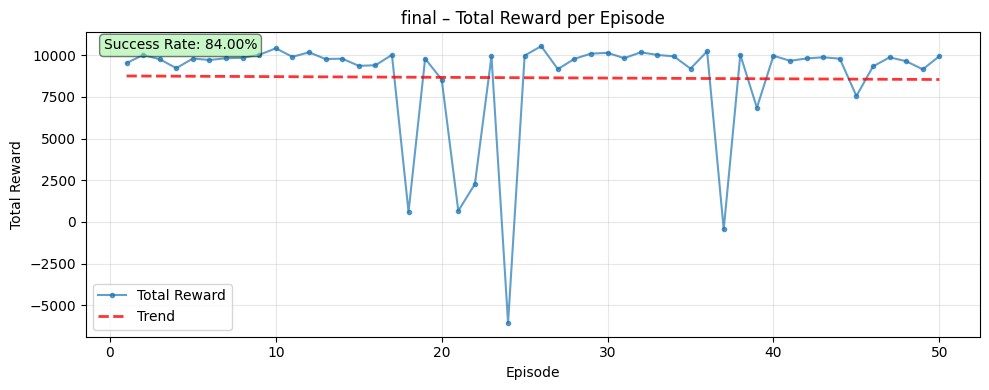

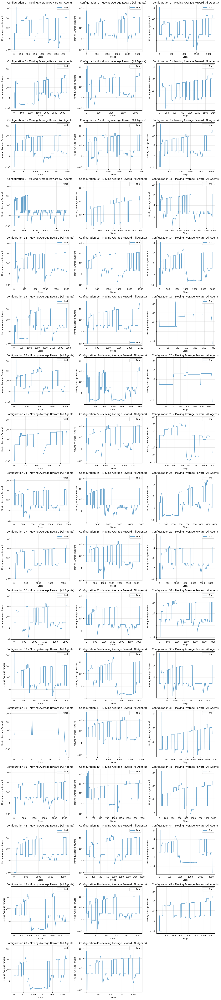

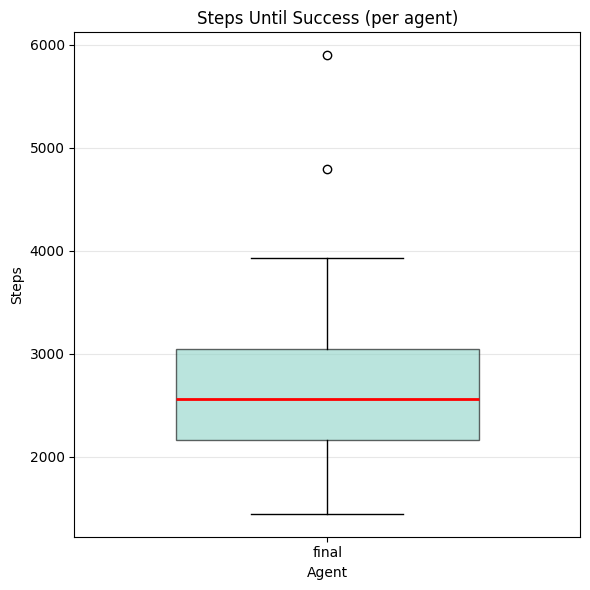

In [9]:
plot_all_q_agent(final_results_5, agents=["final"])

Aumentando il valore di soglia al **70%** si osserva un leggero calo delle performance dell’agente, che tuttavia mantiene una buona capacità di esplorazione anche con requisiti più stringenti.

In [10]:
did_succeed = lambda reward, termination, truncation, info: info.get("explored_ratio", 0) >= 0.70

In [11]:
final_results_5 = evaluate(env=q_env5, agents=q_agents, configs=configs_5, max_steps=10000, did_succeed=did_succeed)

Evaluation: 100%|██████████| 50/50 [09:32<00:00, 11.46s/configuration run]


In [12]:
final_results_5 = rename_inner_keys(final_results_5, {agent_id: "final"})

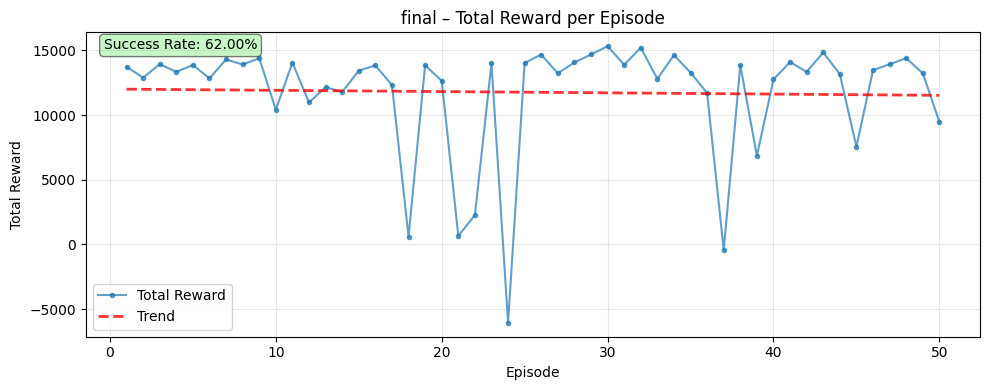

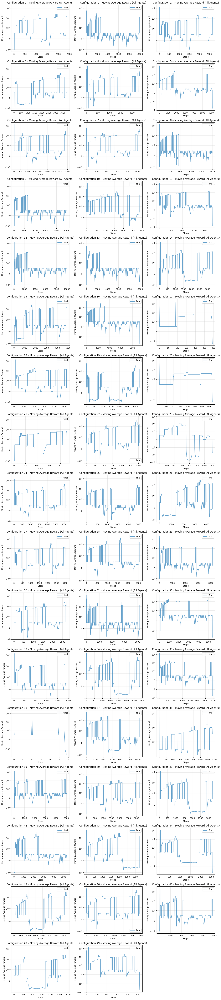

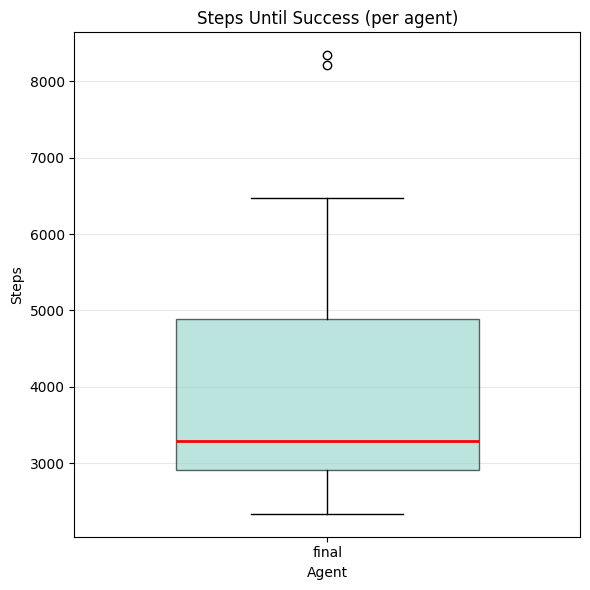

In [13]:
plot_all_q_agent(final_results_5, agents=["final"])

Aumentando ulteriormente la soglia all'**80%**, si nota un calo più significativo delle performance, indicando che l’agente fatica a raggiungere livelli di copertura molto elevati.

In [14]:
did_succeed = lambda reward, termination, truncation, info: info.get("explored_ratio", 0) >= 0.80

Evaluation: 100%|██████████| 50/50 [15:59<00:00, 19.19s/configuration run]


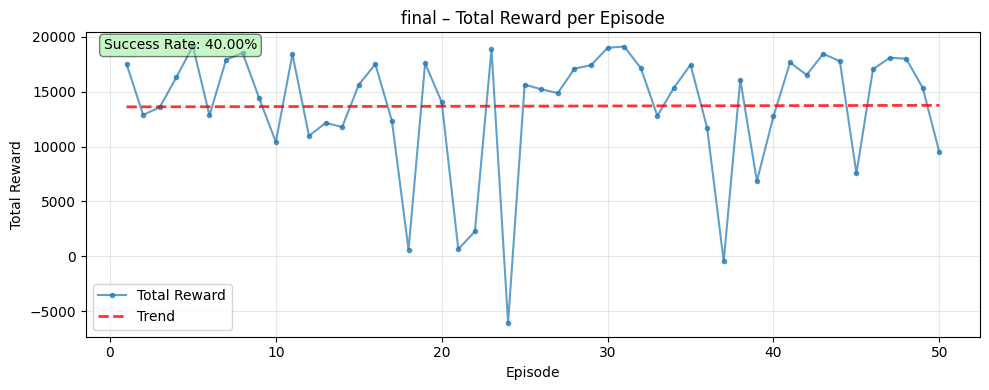

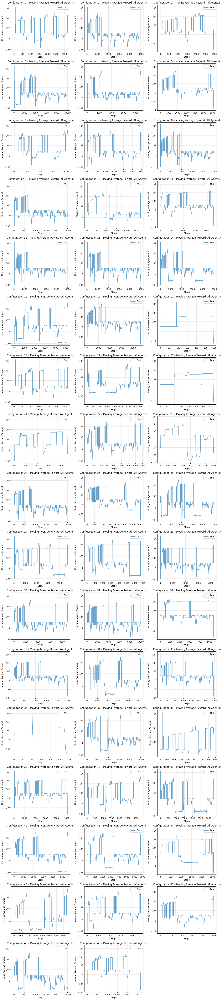

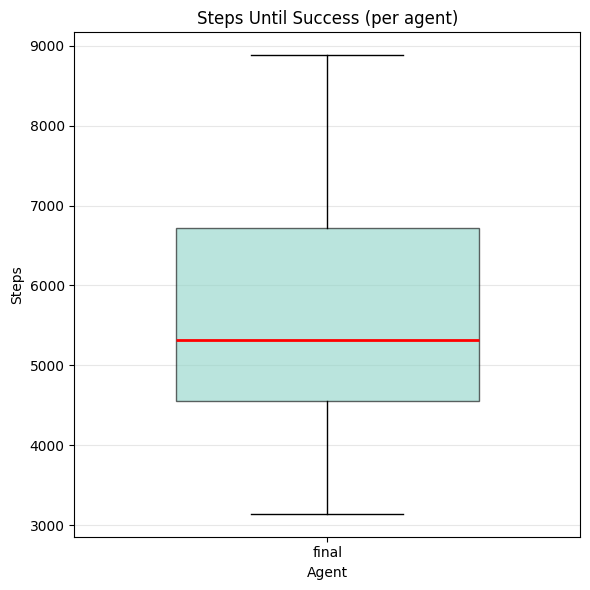

In [15]:
final_results_5 = evaluate(env=q_env5, agents=q_agents, configs=configs_5, max_steps=10000, did_succeed=did_succeed)
final_results_5 = rename_inner_keys(final_results_5, {agent_id: "final"})
plot_all_q_agent(final_results_5, agents=["final"])

Esempio di episodio di test con copertura dell'80% in ambiente 5x5:

![DQ-Agent OK](../resources/exploration-qagent-ok.gif)

Per l'ambiente 5x5, l'agente basato su Q-learning tabellare mostra buone capacità di esplorazione, riuscendo a coprire una porzione significativa della mappa in molti episodi di test. Tuttavia, le performance tendono a diminuire con l'aumentare della soglia di successo richiesta, evidenziando alcune limitazioni nell'approccio tabellare, soprattutto in termini di generalizzazione e gestione di situazioni complesse.

##### Tabella riassuntiva dei risultati:
| Soglia di Successo | Tasso di Successo | Passi Medi |
|--------------------|-------------------|------------|
| 60%                | 84%               | 2500       |
| 70%                | 60%               | 3200       |
| 80%                | 40%               | 5200       |

### Replicazione dei passaggi per l’ambiente 10×10

L'agente Q-learning tabellare è stato addestrato anche in un ambiente di dimensioni 10×10 metri sempre con 5000 episodi da 20000 step ciascuno, seguendo la stessa metodologia utilizzata per l'ambiente 5×5. Di seguito sono riportati i passaggi principali per la connessione all'ambiente, il caricamento dell'agente salvato e la valutazione delle sue performance.

In [25]:
server_address = "localhost:50051"
client_name = "RLClient"
q_env10 = ExplorationEnv(server_address, client_name, grid_size=(10, 10), orientation_bins=8)
q_env10.connect_to_client()

q_agent10 = QAgent(q_env10)
agent_id = "00000000-0000-0000-0000-000000000001"
q_agents = {agent_id: q_agent10}
path = get_yaml_path("src", "notebooks", "report", "resources", "checkpoints", "exploration", "q-learning", "10x10", "checkpoints_final")
q_agent10.load(path)

print("Agent hyperparameters:")
print(f"\tEpsilon-max: {q_agent10.epsilon_max}")
print(f"\tEpsilon-min: {q_agent10.epsilon_min}")
print(f"\tAlpha: {q_agent10.alpha}")
print(f"\tGamma: {q_agent10.gamma}")

# 10x10 configurations
config_10_path = get_yaml_path("src", "notebooks", "report", "resources", "environments", "exploration", "q-learning", "10x10")
yml_files_10 = sorted(config_10_path.glob("*.yml"), key=lambda p: p.name)
configs_10 = [read_file(yml) for yml in yml_files_10]

2026-01-16 12:15:59,848 — INFO — Discrete(5)
2026-01-16 12:15:59,849 — INFO — Discrete(800)
2026-01-16 12:15:59,851 — INFO — ✓ Connected to localhost:50051

2026-01-16 12:15:59,855 — INFO — Agent loaded from C:\Users\HP\Desktop\UNIBO\LaureaMagistrale\1_anno\Paradigmi di Programmazione e Sviluppo (PPS)\Esame\PPS-22-srs\python\src\scripts\resources\checkpoints\exploration\q-learning\10x10\checkpoints_final.npz
2026-01-16 12:15:59,856 — INFO —   Q-table shape: (800, 5)
2026-01-16 12:15:59,856 — INFO —   Current epsilon: 0.0020
2026-01-16 12:15:59,857 — INFO —   Total episodes trained: 5000
Agent hyperparameters:
	Epsilon-max: 1.0
	Epsilon-min: 0.001
	Alpha: 0.5
	Gamma: 0.99


Si procede alla valutazione dell’agente nell’ambiente 10×10, utilizzando soglie di successo pari al **50%** e al **60%** di copertura della mappa, su 20 configurazioni ambientali casuali.

Evaluation: 100%|██████████| 20/20 [15:53<00:00, 47.65s/configuration run]


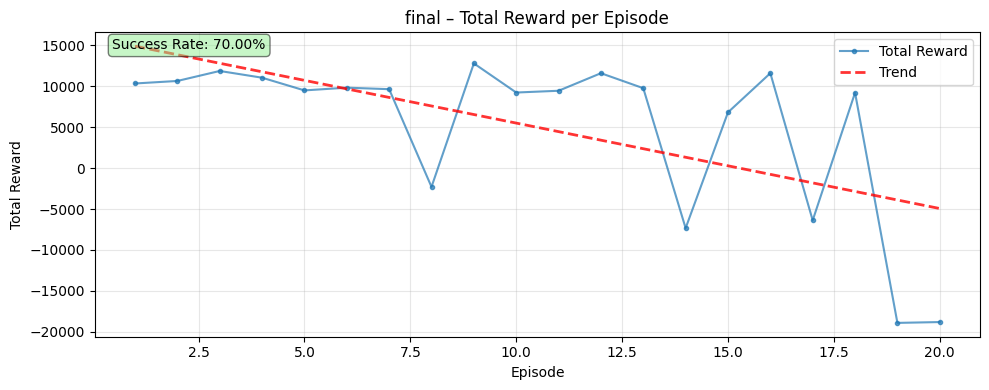

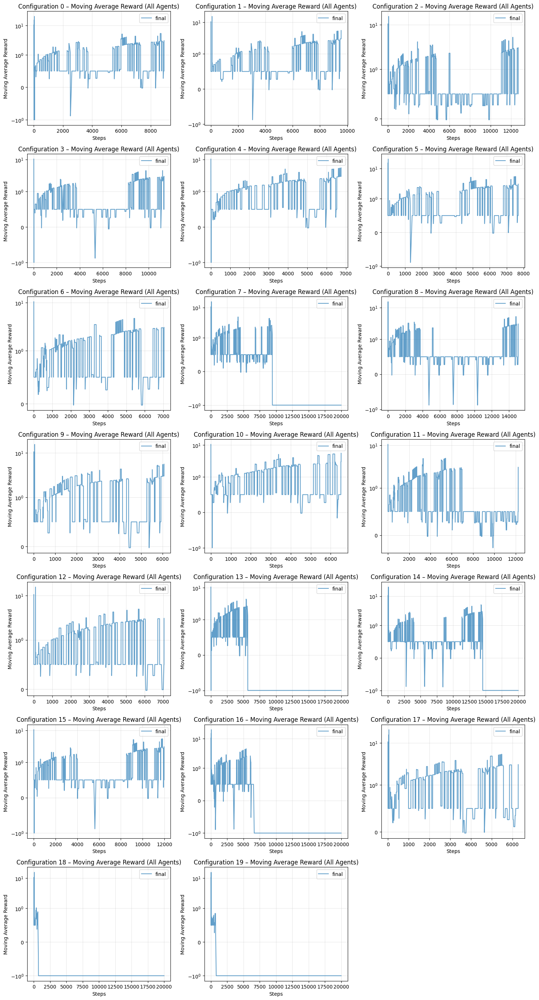

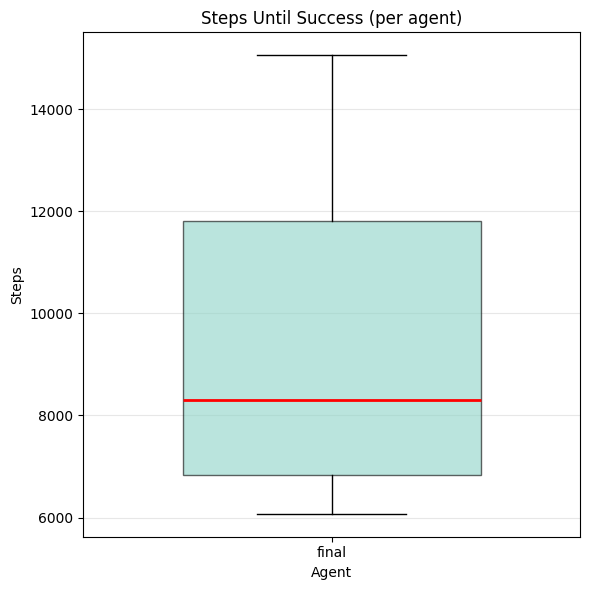

In [15]:
did_succeed = lambda reward, termination, truncation, info: info.get("explored_ratio", 0) >= 0.50

final_results_10 = evaluate(env=q_env10, agents=q_agents, configs=configs_10, max_steps=20000, did_succeed=did_succeed)
final_results_10 = rename_inner_keys(final_results_10, {agent_id: "final"})
plot_all_q_agent(final_results_10, agents=["final"])

Evaluation: 100%|██████████| 20/20 [23:53<00:00, 71.69s/configuration run]


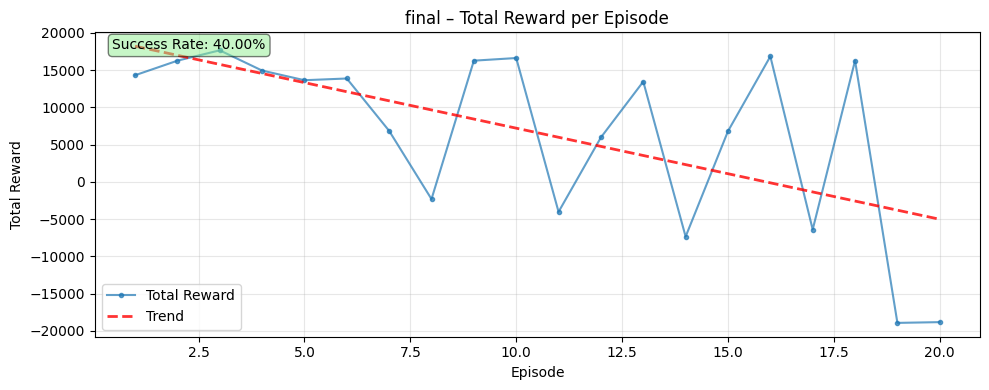

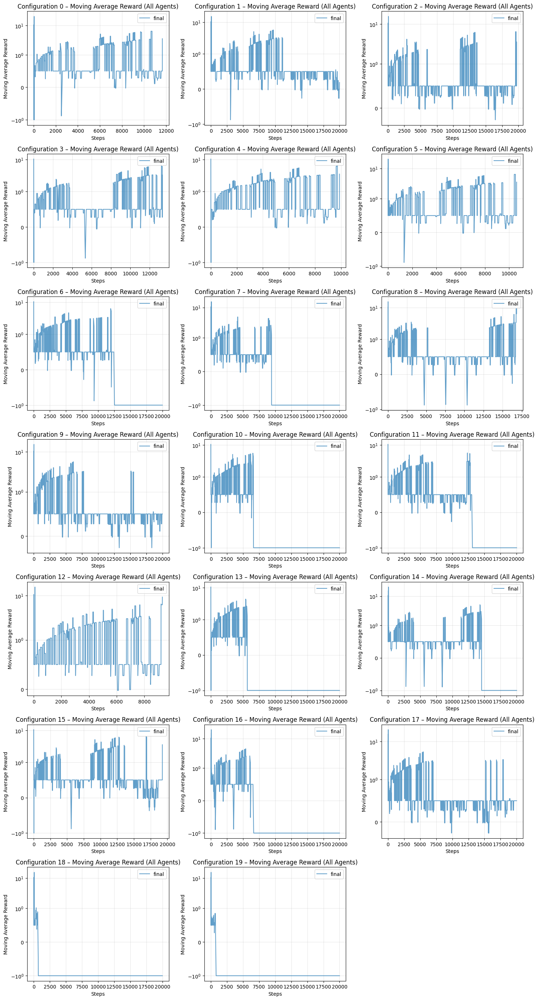

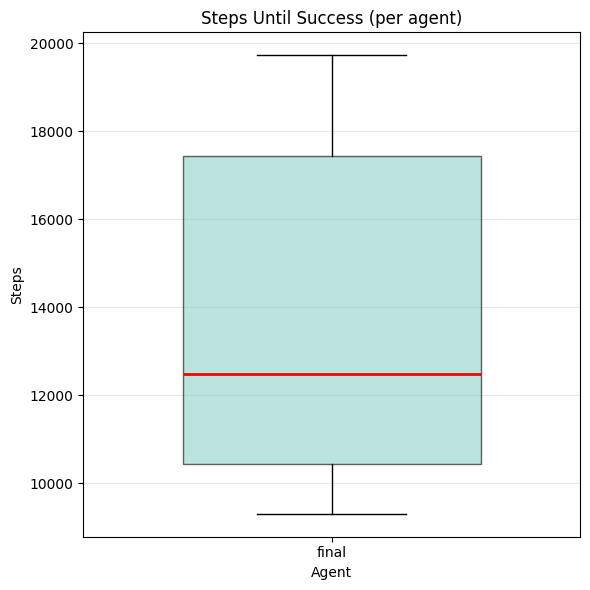

In [16]:
did_succeed = lambda reward, termination, truncation, info: info.get("explored_ratio", 0) >= 0.60

final_results_10 = evaluate(env=q_env10, agents=q_agents, configs=configs_10, max_steps=20000, did_succeed=did_succeed)
final_results_10 = rename_inner_keys(final_results_10, {agent_id: "final"})
plot_all_q_agent(final_results_10, agents=["final"])

Le prove con l’agente Q-learning tabellare in ambiente 10×10 mostrano una riduzione delle performance rispetto all’ambiente 5×5, evidenziando le difficoltà dell’approccio tabellare nel gestire spazi di stato più ampi. La riduzione delle performance non dipende dal numero di step poiché sono stati aumentati da 10000 in ambiente 5×5 a 20000 in ambiente 10×10. In particolare, il tasso di successo diminuisce significativamente con l’aumentare della soglia di copertura richiesta, indicando che l’agente fatica a esplorare efficacemente l’intera area.

Tabella riassuntiva dei risultati:
| Soglia di Successo | Tasso di Successo | Passi Medi |
|--------------------|-------------------|------------|
| 50%                | 70%               | 8200       |
| 60%                | 40%               | 12200      |

### Analisi errori

Di seguito sono riportate le principali criticità riscontrate utilizzando l’approccio basato su Q-Learning tabellare nel task di exploration.

#### Polarizzazione sugli stati visitati più spesso

Una delle limitazioni più evidenti riguarda la scarsa capacità di generalizzazione dell’agente.
Nel Q-learning tabellare, infatti, ogni stato viene appreso esclusivamente quando viene visitato: non esiste la possibilità di inferire valori per stati simili o per regioni spaziali non ancora esplorate.

Questo comporta una forte polarizzazione verso gli stati più frequenti, con i seguenti effetti:
- esplorazione incompleta della mappa;
- tendenza a permanere in regioni note;
- difficoltà nel recuperare situazioni iniziali sfavorevoli.

Il problema è amplificato dalla codifica dello stato basata sulle coordinate (x, y) e dall’ampiezza dello spazio degli stati.

Esempio di episodio di test con copertura del 60% in ambiente 5x5, dove l'agente rimane nelle stesse celle già visitate, l'episodio termina per raggiungimento del numero massimo di passi:
![Q-Agent Same Visited Cells](../resources/exploration-qagent-same-visited-cells.gif)

#### Difficoltà nell’uscire da loop comportamentali

I loop comportamentali si verificano quando l’agente entra in una sequenza ricorrente di stati e azioni che non producono alcun avanzamento significativo nell’esplorazione della mappa.
Nonostante la penalità per lo stallo, l’agente può comunque rimanere intrappolato in:
- piccoli cicli di azioni ripetute;
- rotazioni continue sul posto quando la reward locale non fornisce indicazioni chiare.

Nel contesto del task di exploration, tali loop si manifestano più frequentemente:
- nelle vicinanze di pareti o angoli;
- in zone già ampiamente esplorate e quindi con reward marginali o nulle;
- quando la struttura della reward locale non fornisce all’agente un’indicazione chiara su quale direzione favorisca una maggiore copertura.

Il Q-learning tabellare, per sua natura, non possiede memoria a lungo termine né un modello dell’ambiente, e non può riconoscere esplicitamente di trovarsi in un ciclo ricorrente.
Di conseguenza, quando i valori di Q associati alle azioni disponibili in uno stato sono simili o poco informativi, l’agente tende a reiterare la prima sequenza che gli restituisce una reward non particolarmente negativa, restando intrappolato nel loop.

Quando ciò accade, la *Mean Average Reward* tende a stabilizzarsi su valori negativi, poiché le penalità accumulate durante le azioni ripetitive superano eventuali reward locali.

Questi fenomeni rappresentano uno dei limiti più noti dei metodi tabellari: una volta instaurati, i loop comportamentali sono difficili da eliminare, e le performance dell’agente diventano meno prevedibili e meno robuste.

Nell'ambiente 10x10, l'agente va in loop molto più frequentemente rispetto all'ambiente 5x5. Esempio di episodio di test in ambiente 10x10, in cui l'agente entra in un loop comportamentale:
![Q-Agent Loop Behavior](../resources/exploration-qagent-loop.gif)

#### Sensibilità elevata al design della reward

Sono state testate molteplici versioni della funzione di reward.
Si è osservato che:
- reward troppo complesse tendevano a introdurre rumore, causando instabilità;
- reward troppo ricche di bonus/penalità portavano l’agente a ottimizzare un solo aspetto del comportamento;
- reward più semplici risultavano più stabili ma non sempre sufficienti a guidare l’esplorazione completa.

Nel task di exploration, questo problema è particolarmente rilevante poiché la reward è intrinsecamente **sparsa**: solo la scoperta di nuove celle fornisce un segnale utile.
L'agente, in assenza di un modello dell’ambiente, dipende quindi in modo critico dalla qualità del segnale di reward fornito.

Anche la versione attuale, pur essendo la più efficace tra quelle testate, non garantisce prestazioni ottimali in tutte le configurazioni e presenta margini di miglioramento.

### Commenti finali

L'approccio basato su Q-Learning tabellare ha permesso di affrontare il task di exploration in modo diretto e interpretabile, tuttavia ha evidenziato alcune limitazioni intrinseche legate alla natura tabellare del metodo.
In particolare, la difficoltà nel generalizzare sugli stati non visitati, la tendenza a rimanere intrappolati in loop comportamentali e la sensibilità al design della reward hanno rappresentato ostacoli significativi.
Questi problemi hanno motivato il successivo passaggio a un approccio basato su Deep Q-Learning, che offre una maggiore capacità di approssimazione e generalizzazione grazie all'uso di reti neurali.

# Deep Q-Learning

Il task di exploration è stato successivamente affrontato utilizzando un Deep Q-Agent.

Rispetto al Q-Learning tabellare, l’approccio deep consente di operare in uno spazio di osservazione continuo e sfrutta una rete neurale per approssimare la funzione Q.

## Import delle librerie

In [26]:
from environment.deepqlearning.exploration_env import ExplorationEnv as DQExplorationEnv
from agent.scala_dqagent import DQAgent
from training.dqnetwork import DQNetwork

## Connessione all'ambiente

In [27]:
server_address = "localhost:50051"
client_name = "RLClient"
dq_env = DQExplorationEnv(server_address, client_name)
dq_env.connect_to_client()

2026-01-16 12:16:55,779 — INFO — ✓ Connected to localhost:50051



### Problemi riscontrati

#### Osservazioni
Nonostante l’inclusione della posizione dell’agente all’interno delle osservazioni, tale informazione si è rivelata insufficiente a garantire un comportamento esplorativo efficace. In particolare, una rappresentazione puramente globale della posizione non forniva indicazioni adeguate sulla struttura locale dell’ambiente né sulla ripetitività dei movimenti effettuati.

Per questo motivo, si è reso necessario innanzitutto normalizzare la posizione e poi arricchire lo spazio delle osservazioni con informazioni aggiuntive in grado di fornire all’agente una visione locale più informativa, introducendo descrittori relativi all’intorno immediato e alla frequenza di visita delle celle vicine. Questa scelta ha permesso di mitigare, almeno parzialmente, la tendenza dell’agente a compiere movimenti ripetitivi e a rimanere confinato in aree limitate della mappa.

#### Gestione della reward in funzione del task

Sono state effettuate diverse prove per bilanciare i task di *obstacle avoidance* e *exploration*, tra cui due modalità principali:

1. Reward combinata:
    inizialmente, i due task erano combinati in un unico processo di apprendimento, utilizzando le rispettive reward così come definite. A causa delle differenze nei range di valori, la componente di exploration risultava spesso sovrastata da quella di evitamento collisioni. L’agente tendeva quindi a privilegiare l’evitamento ostacoli, riducendo la copertura dell’ambiente.
2. Reward modulata in base al task:
    in una seconda serie di esperimenti, le reward venivano assegnate esclusivamente in funzione del task corrente, cercando di far apprendere all’agente un comportamento bilanciato. Anche in questo caso, però, i risultati non sono stati soddisfacenti: l’agente tendeva comunque a concentrarsi su un singolo task, evidenziando la difficoltà di bilanciare correttamente gli obiettivi con questa strategia.

Per mitigare questi problemi, nelle prove successive è stato adottato un approccio semplificato, basato su:
- una penalità di collisione specifica per il task di exploration;
- una ricompensa di movimento progettata per incentivare azioni utili senza interferire con la componente esplorativa.

Questo schema ha permesso di bilanciare meglio i due obiettivi, migliorando la capacità dell’agente di esplorare l’ambiente senza trascurare la sicurezza.

#### Tempo di convergenza

Il tempo di convergenza per il task di exploration si è rivelato particolarmente critico rispetto ad altri task. La necessità di visitare l’intera mappa comporta un numero elevato di passi e di episodi, soprattutto in ambienti di grandi dimensioni. Tale requisito rallenta l’apprendimento, poiché l’agente deve accumulare un ampio insieme di esperienze prima di esplorare in modo completo ed efficace lo spazio degli stati.

#### Numero di step

Il numero di step per episodio è stato impostato in modalità **incrementale**. L’episodio inizia con un numero ridotto di passi (100), che viene progressivamente aumentato a intervalli regolari durante l’addestramento fino a raggiungere un numero massimo prefissato (20000).

Questa strategia consente di:

- facilitare l’apprendimento nelle prime fasi, riducendo complessità e durata degli episodi;
- garantire una copertura più ampia della mappa nelle fasi successive, quando l’agente ha acquisito una policy più stabile;
- bilanciare l’efficienza computazionale con la necessità di accumulare esperienze significative.

## Osservazioni

Nel caso del **Deep Q-Learning**, sono state considerate diverse rappresentazioni dello stato.

In una prima formulazione, lo stato dell’agente includeva:
- la **posizione globale**, espressa tramite le coordinate normalizzate $(x, y)$, indipendenti dalle dimensioni assolute della mappa;
- l’**orientazione**, rappresentata attraverso le componenti **$\sin(\theta)$** e **$\cos(\theta)$**. Questa scelta consente di evitare le discontinuità e le ambiguità tipiche delle rappresentazioni angolari basate sui gradi;
- **8 sensori di prossimità**, disposti uniformemente attorno all’agente con un passo angolare di 45°, che restituiscono una stima normalizzata della distanza dagli ostacoli compresa tra 0 e 1.

Tuttavia, l’inclusione esplicita della posizione globale normalizzata nel Deep Q-Learning non ha sempre prodotto risultati soddisfacenti. Per questo motivo, sono state considerate rappresentazioni alternative basate su una **descrizione locale dell’intorno** dell’agente, in grado di fornire informazioni utili all’esplorazione senza fare affidamento diretto su una codifica globale della posizione. L’obiettivo di questo approccio è mantenere un’informazione spaziale rilevante, riducendo al contempo la dipendenza da coordinate assolute.

In particolare, per arricchire lo spazio delle osservazioni, è stata introdotta una funzione che fornisce informazioni locali sulle **celle visitate di recente** nelle vicinanze della posizione corrente dell’agente.

La funzione mantiene una mappa che associa a ciascuna cella un valore reale, interpretabile come una **stima della recente frequenza di visita**. A ogni passo:

- tutti i valori della mappa vengono leggermente **decaduti nel tempo** mediante un fattore moltiplicativo inferiore a 1;
- la cella corrispondente alla posizione corrente dell’agente viene aggiornata con valore massimo.

A partire da questa mappa aggiornata, viene quindi estratto un **intorno locale 5×5** centrato sulla posizione corrente. Per ciascuna cella dell’intorno viene restituito il valore associato, oppure un valore pari a −1 nel caso in cui la cella ricada al di fuori dei bordi della mappa. Questa scelta consente di fornire all’agente un’informazione esplicita sulla presenza dei confini dell’ambiente, distinguendo chiaramente le celle non esplorate da quelle non accessibili.

Formalmente, l’output della funzione è costituito da:
- una mappa aggiornata delle celle visitate con decadimento temporale;
- un vettore di valori reali che rappresenta lo stato di visita delle celle vicine.

Questo meccanismo fornisce all’agente un’informazione spaziale locale sulla ripetitività dei movimenti, permettendo di distinguere le aree frequentemente percorse da quelle meno esplorate. Tale informazione viene utilizzata come osservazione aggiuntiva per favorire comportamenti esplorativi più efficaci e ridurre la probabilità di incorrere in loop locali.


Esempio di intorno locale (5×5)

La seguente tabella mostra un esempio della finestra locale 5×5 centrata sull’agente, ricavata dalla lista `visited_positions`. I valori rappresentano la frequenza di visita delle celle vicine, soggetta a decadimento temporale. La cella centrale corrisponde alla posizione corrente dell’agente.

| y\x | 0      | 1      | 2      | 3      | 4      |
|-----|--------|--------|--------|--------|--------|
| 0   | 0.0    | 0.0    | 0.0    | 0.0    | 0.0    |
| 1   | 0.0    | 0.0    | 0.0    | 0.0    | 0.0    |
| 2   | 0.0    | 0.0    | **1.0** | 0.0    | 0.0    |
| 3   | 0.0    | 0.7067 | 0.7407 | 0.0    | 0.0    |
| 4   | 0.0    | 0.5261 | 0.0    | 0.0    | 0.0    |

La soluzione fornita prevede le seguenti informazioni come osservazioni:

```python
def _encode_observation(self, proximity_values, light_values, position, orientation, visited_positions):
    orientation_sin = np.sin(np.radians(orientation))
    orientation_cos = np.cos(np.radians(orientation))

    return np.array(
        [
            orientation_sin,
            orientation_cos,
            *visited_positions,
            *proximity_values
        ],
        dtype=np.float32
    )
```

## Azioni

Le azioni disponibili per l’agente coincidono con le cinque utilizzate nell’approccio di Q-Learning tabellare. Esse corrispondono a un movimento in avanti, a rotazioni sul posto in senso orario e antiorario, e a curve dolci verso destra e sinistra.

Rispetto alla formulazione tabellare, le curve dolci risultano tuttavia più accentuate, al fine di ottenere variazioni direzionali più marcate durante l’esplorazione.

```python
self.actions = [
    (1.0, 1.0),  # forward
    (1.0, -1.0),  # left
    (-1.0, 1.0),  # right
    (1.0, 0.0),  # soft right
    (0.0, 1.0),  # soft left
]
```

## Configurazione ambienti

Per il **Deep Q-Learning** è stata adottata una configurazione differente rispetto a quella utilizzata per l’agente di Q-Learning tabellare, al fine di rispettare le specifiche e i vincoli imposti.
In particolare, per la fase di training sono stati selezionati manualmente **50** ambienti da un insieme di scenari generati casualmente. Tutti gli ambienti presentano dimensioni pari a 10×10, con un numero di ostacoli compreso tra 5 e 10 e dimensioni degli ostacoli variabili nell’intervallo [0.7, 1.5].

## Approccio risolutivo

Di seguito vengono mostrate le soluzioni adottate per risolvere i problemi riscontrati e la realizzazione dell'agente di Deep Q-Learning.

### Reward

La funzione di reward adottata per il DQL è più **densa** e informativa. Molte componenti sono state riprese direttamente dall’approccio precedente, mentre altre sono state introdotte per fornire segnali più dettagliati alla rete neurale.

La ricompensa totale è data dalla **somma di più contributi**, ciascuno progettato per influenzare un aspetto specifico del comportamento dell’agente:

1. penalità per collisione

    La distanza minima dagli ostacoli viene stimata tramite i sensori di prossimità.

    - **Collision hard penalty**: −100.0

    Scopo: rendere le collisioni estremamente costose, forzando l’agente a politiche di evitamento affidabili.

2. bonus per esplorazione di nuove celle

    L’ambiente viene discretizzato in celle; la prima visita a una cella genera un bonus immediato.

    - **Exploration bonus**: +10.0

    Scopo: incentivare una rapida espansione dell’area esplorata, soprattutto nelle fasi iniziali dell’episodio.

3. bonus di esplorazione count-based

    Oltre al bonus binario per nuova cella, viene introdotto un **meccanismo di esplorazione basato sulla frequenza di visita**.

    - **Count-based bonus**:
      $$
      r = \frac{1}{\sqrt{n + 1}}
      $$
      dove \( n \) è il numero di visite alla cella corrente.

    Scopo: ridurre progressivamente l’incentivo a visitare ripetutamente la stessa area, favorendo la scoperta di regioni meno esplorate.

4. penalità per stallo (stuck)

    L’agente viene considerato *stuck* in due casi:

    - rimane nella stessa posizione per una finestra temporale prefissata;
    - visita la stessa cella più di un numero massimo consentito di volte.

    - **Stuck penalty**: −1.0

    Scopo: prevenire comportamenti ciclici o stagnanti inefficaci per l’esplorazione.

5. reward di movimento

    Viene introdotta una **reward di movimento legata all’azione eseguita**, per guidare l’apprendimento locale:

    - movimento in avanti: piccolo bonus costante;
    - rotazione:
      - bonus se effettuata vicino a un ostacolo;
      - lieve penalità se effettuata in assenza di pericolo.

    Scopo: favorire movimenti utili e coerenti con il contesto, migliorando la stabilità dell’apprendimento.

6. bonus per milestone di copertura

    La copertura dell’ambiente viene stimata in modo continuo; ogni incremento percentuale non ancora raggiunto genera un bonus.

    - **Milestone bonus**: proporzionale alla percentuale di copertura raggiunta

    Scopo: fornire un segnale di progresso graduale verso l’obiettivo globale, evitando reward troppo sparse.

7. bonus finale per completamento della copertura

    Quando la copertura supera una soglia prefissata (es. **80%**), viene assegnato un bonus.

    - **Coverage bonus massimo**: +500.0

    Scopo: rafforzare il comportamento di completamento dell’esplorazione.

#### Note sul meccanismo count-based exploration

Per rendere l’esplorazione più densa, si è pensato di usare il **concetto generale di count-based exploration** descritto nei principali lavori di _Reinforcement Learning_, in cui:
- ogni stato \(s\) dispone di un **contatore di visite** \(N(s)\);
- alla reward originale viene aggiunto un **bonus inversamente proporzionale al numero di visite**:

$$
r_{\text{bonus}}(s) = \frac{\beta}{\sqrt{N(s)+1}}
$$

Tale approccio incentiva l’agente a preferire stati poco visitati, fornendo un segnale matematico per esplorare nuove aree dell’ambiente.

Invece di considerare gli stati completi dell’agente (posizione, orientamento, letture dei sensori, ecc.), l’ambiente viene **discretizzato in celle** e il conteggio viene applicato sulle celle visitate. La visita a una nuova cella genera il bonus massimo, mentre le celle già visitate ripetutamente producono un bonus decrescente.

### Termination

Per la terminazione dell'episodio si è mantenuta la stessa regola utilizzata per il Q-Agent, ovvero la terminazione avviene in caso di collisione con un ostacolo/bordo (terminazione negativa) oppure in caso di raggiungimento di un certo valore di soglia, fissato all'**80%** della copertura della mappa (terminazione positiva).

### Truncation

Anche per la troncatura dell'episodio si è mantenuta la stessa regola utilizzata per il Q-Agent, ovvero l'episodio viene troncato quando l'agente raggiunge il numero massimo di passi consentiti per l'ambiente in cui si trova.

### Deep Q-Agent

L'agente con il quale sono stati ottenuti i migliori risultati dispone di una rete neurale con le seguenti caratteristiche:

| Layer    | Tipo | Neuroni | Funzione di Attivazione |
|----------|------|---------|-------------------------|
| Input    | Dense | 8       | - |
| Hidden 1 | Dense | 128     | ReLU |
| Hidden 2 | Dense | 64      | ReLU |
| Hidden 3 | Dense | 32      | ReLU |
| Output   | Dense | 5       | - |

Come *loss function* è stata utilizzata la *Mean Squared Error* (**MSE**), mentre come ottimizzatore si è scelto **Adam** con un learning rate di 0.001.

Gli iperparametri utilizzati per l'addestramento dell'agente sono i seguenti:

| Parametro | Valore | Descrizione |
|-----------|--------|-------------|
| ε-max | 1.0 | Valore iniziale di epsilon |
| ε-min | 0.01 | Valore minimo di epsilon |
| γ (gamma) | 0.99 | Fattore di sconto |
| Decay di ε | Esponenziale | Modalità di decadimento |

Per l'addestramento sono stati utilizzati:

| Parametro | Valore | Descrizione |
|-----------|--------|-------------|
| Replay Buffer Size | 100000 | Dimensione del buffer di esperienza |
| Batch Size | 64 | Dimensione del batch per l'aggiornamento |
| Update Frequency | 4 step | Frequenza aggiornamento rete principale |
| Target Update Frequency | 1000 step | Frequenza copia pesi nella rete target |

L’addestramento dell’agente è stato effettuato per un totale di **10000 episodi**, con un numero di **step per episodio** incrementale fino a **20000**: inizialmente gli episodi prevedevano pochi step, che venivano progressivamente aumentati durante l’addestramento, fino a raggiungere il massimo prefissato.

Durante l’addestramento, ogni volta che la _moving average reward_ migliorava, veniva salvata una copia del modello dell’agente. Questo ha permesso di monitorare i progressi dell’apprendimento e di mantenere una versione stabile dell’agente, garantendo una base sicura per la valutazione delle performance.

#### Esperimenti con architetture alternative

Sono state valutate diverse configurazioni dei layer nascosti al fine di aumentare la capacità espressiva del modello, tra cui: [64, 32], [128, 64, 32], [256, 128], [128, 128], [256, 256], oltre ad altre configurazioni intermedie.

Questi risultati indicano che un aumento della complessità della rete non comporta necessariamente un miglioramento delle prestazioni nel task di esplorazione. La configurazione [128, 64, 32] rappresenta quindi il miglior compromesso tra capacità del modello e stabilità dell’apprendimento.

In [28]:
dq_init_env_path = get_yaml_path("src", "notebooks", "report", "resources", "environments", "exploration", "dq-learning", "10x10", "environment_0000.yml")
dq_init_env = read_file(dq_init_env_path)
dq_env.init(dq_init_env)
neuron_count_per_hidden_layer = [128, 64, 32]
dq_agent_id = "00000000-0000-0000-0000-000000000001"
dq_agent = DQAgent(
    dq_env,
    agent_id=dq_agent_id,
    action_model=DQNetwork(
        dq_env.observation_space.shape,
        neuron_count_per_hidden_layer,
        dq_env.action_space.n,
        summary=False,
    ),
    target_model=DQNetwork(
        dq_env.observation_space.shape,
        neuron_count_per_hidden_layer,
        dq_env.action_space.n,
        summary=False,
    ),
)
dq_agents = {dq_agent_id: dq_agent}

#### Caricamento agente precedentemente salvato

In [29]:
path = get_yaml_path("src", "notebooks", "report", "resources", "checkpoints", "exploration", "dq-learning", "checkpoints_ep3081")
dq_agent.load(path)
print("DQ-Agent hyperparameters:")
print(f"\tEpsilon-max: {dq_agent.epsilon_max}")
print(f"\tEpsilon-min: {dq_agent.epsilon_min}")
print(f"\tGamma: {dq_agent.gamma}")
print(f"\tReplay memory max size: {dq_agent.replay_memory.maxlen}")
print(f"\tSteps per update: {dq_agent.step_per_update}")
print(f"\tSteps per update target model: {dq_agent.step_per_update_target_model}")

DQ-Agent hyperparameters:
	Epsilon-max: 1.0
	Epsilon-min: 0.01
	Gamma: 0.99
	Replay memory max size: 100000
	Steps per update: 4
	Steps per update target model: 1000


C:\Users\HP\Desktop\UNIBO\LaureaMagistrale\1_anno\Paradigmi di Programmazione e Sviluppo (PPS)\Esame\PPS-22-srs\python\.venv\Lib\site-packages\keras\src\saving\saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 18 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


### Valutazione delle performance

La valutazione delle performance dell’agente viene condotta su 110 episodi di test, ciascuno eseguito in un ambiente distinto scelto manualmente da un insieme di mappe generate casualmente. Tutti gli ambienti presentano ostacoli con dimensioni comprese nell’intervallo [0.7, 1.5]; negli ambienti piccoli il numero di ostacoli varia tra 1 e 4, mentre per le restanti configurazioni è compreso tra 5 e 10.

Le configurazioni di valutazione comprendono:
- 50 ambienti piccoli (5×5 m);
- 20 ambienti medio-piccoli (10×10 m);
- 20 ambienti medi (20×20 m);
- 20 ambienti grandi (30×30 m).

Questa suddivisione permette di analizzare il comportamento dell’agente in scenari caratterizzati da livelli crescenti di complessità, valutandone la capacità di adattarsi a dimensioni ambientali e densità di ostacoli differenti.

#### Caricamento degli ambienti di valutazione

In [30]:
# 5x5 configurations
dq_config_5_path = get_yaml_path("src", "notebooks", "report", "resources", "environments", "exploration", "dq-learning", "5x5")
dq_yml_files_5 = sorted(dq_config_5_path.glob("*.yml"), key=lambda p: p.name)
dq_configs_5 = [read_file(yml) for yml in dq_yml_files_5]

# 10x10 configurations
dq_config_10_path = get_yaml_path("src", "notebooks", "report", "resources", "environments", "exploration", "dq-learning", "10x10")
dq_yml_files_10 = sorted(dq_config_10_path.glob("*.yml"), key=lambda p: p.name)
dq_configs_10 = [read_file(yml) for yml in dq_yml_files_10]

# 20x20 configurations
dq_config_20_path = get_yaml_path("src", "notebooks", "report", "resources", "environments", "exploration", "dq-learning", "20x20")
dq_yml_files_20 = sorted(dq_config_20_path.glob("*.yml"), key=lambda p: p.name)
dq_configs_20 = [read_file(yml) for yml in dq_yml_files_20]

# 30x30 configurations
dq_config_30_path = get_yaml_path("src", "notebooks", "report", "resources", "environments", "exploration", "dq-learning", "30x30")
dq_yml_files_30 = sorted(dq_config_30_path.glob("*.yml"), key=lambda p: p.name)
dq_configs_30 = [read_file(yml) for yml in dq_yml_files_30]

#### Creazione della funzione di valutazione

Per valutare l’efficacia dell’agente Deep Q-Learning nella copertura della mappa, è stata adottata una metrica derivata dall’approccio utilizzato nel Q-Learning tabellare: `explored_ratio`.

Nel caso del Deep Q-Learning, gli ambienti utilizzati per il training e la valutazione presentano ostacoli e dimensioni variabili, il che introduce alcune difficoltà aggiuntive:
1. la presenza di ostacoli riduce la porzione di spazio effettivamente percorribile, rendendo più complesso ottenere valori elevati di copertura;
2. la funzione di valutazione non distingue tra celle libere e celle occupate da ostacoli; ogni cella della mappa virtuale contribuisce in egual misura all'`explored_ratio`;
3. gli ambienti di valutazione includono mappe di dimensioni diverse (5×5, 10×10, 20×20, 30×30), rendendo necessario normalizzare la copertura in modo comparabile tra mappe differenti.

Per gestire questo ultimo punto, è stata introdotta una **griglia virtuale** di dimensione fissa (5×5), indipendente dalle dimensioni reali della mappa. La posizione reale dell’agente viene scalata sulla griglia virtuale, e l'`explored_ratio` viene calcolato come rapporto tra le celle virtuali visitate e il numero totale di celle della griglia. In questo modo, la metrica di copertura risulta:
- comparabile tra mappe di dimensioni diverse;
- indicativa della tendenza esplorativa dell’agente, riflettendo la sua capacità di raggiungere regioni differenti dell’ambiente piuttosto che la copertura dettagliata delle singole celle libere.

Poiché la copertura massima effettiva è ridotta dagli ostacoli, le soglie di successo per il Deep Q-Learning sono state impostate più basse rispetto al Q-Learning tabellare, al fine di mantenere coerenza nella valutazione e considerare la maggiore complessità degli ambienti.

#### Valutazione dell'agente

Inizialmente si valuta l’agente con una soglia di successo del **30%** di copertura della mappa.

Evaluation: 100%|██████████| 20/20 [1:17:34<00:00, 232.72s/configuration run]


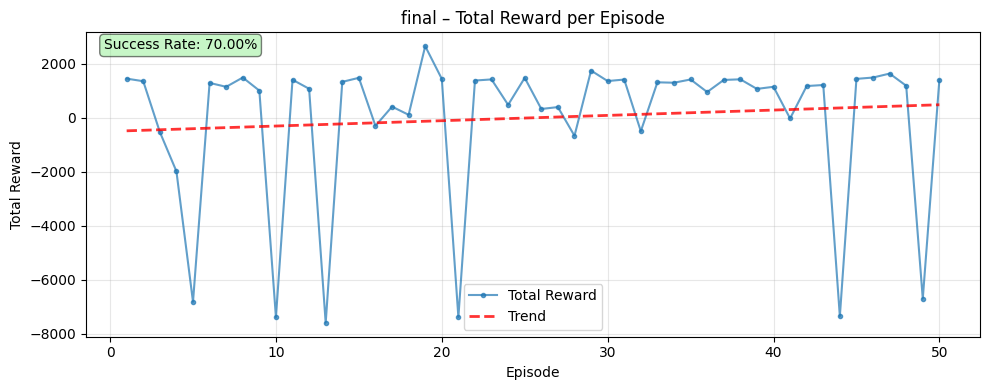

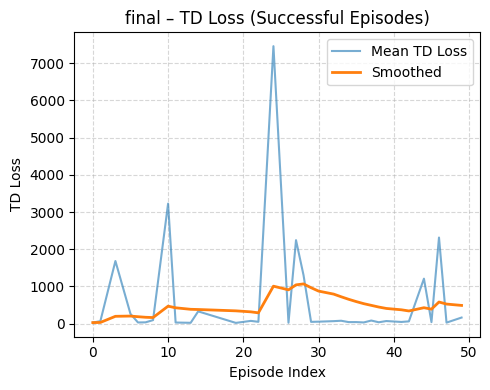

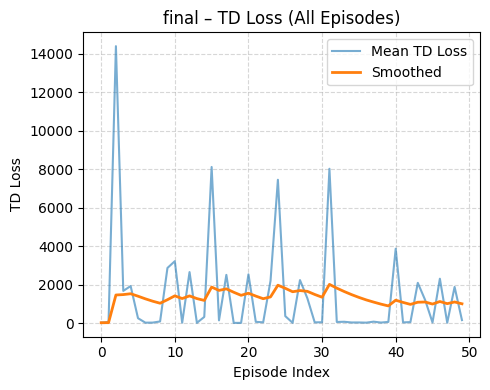

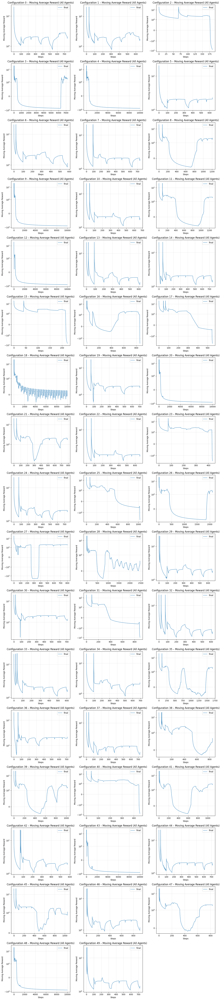

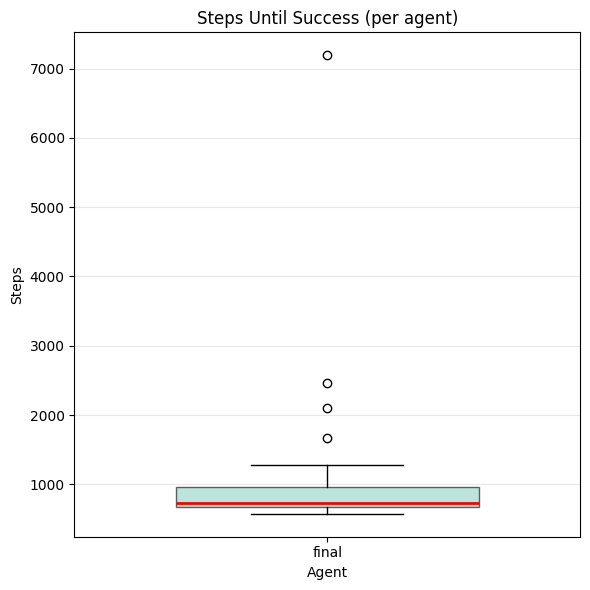

...

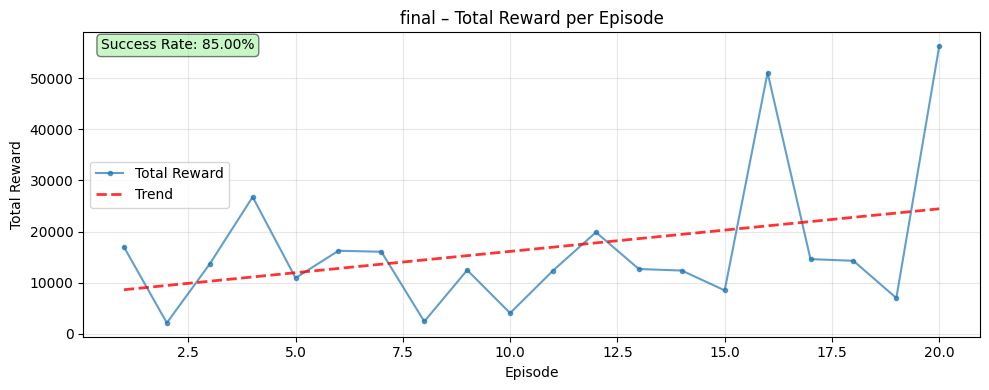

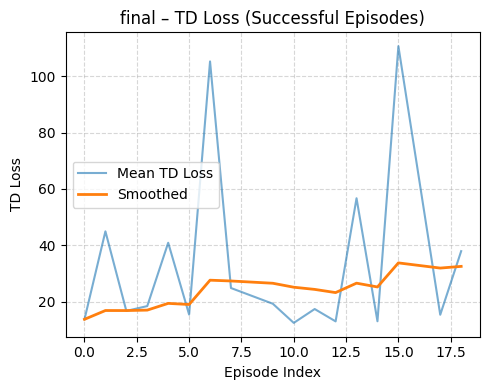

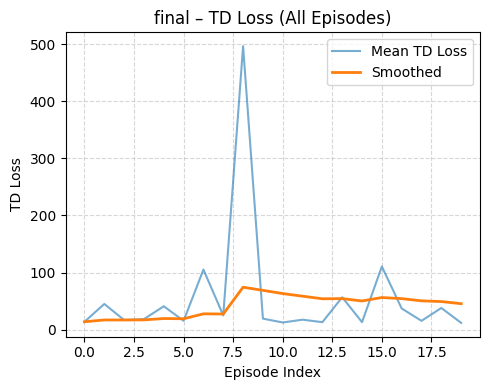

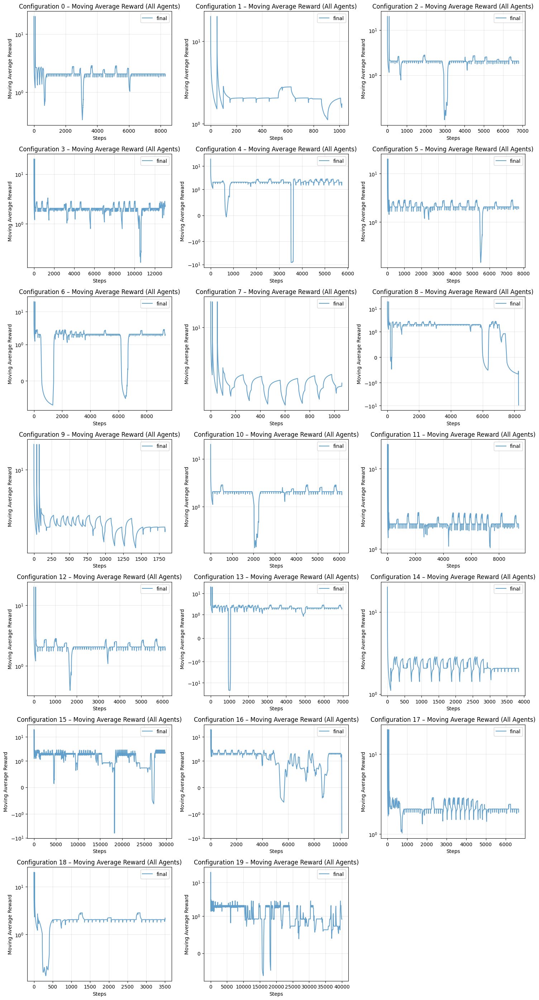

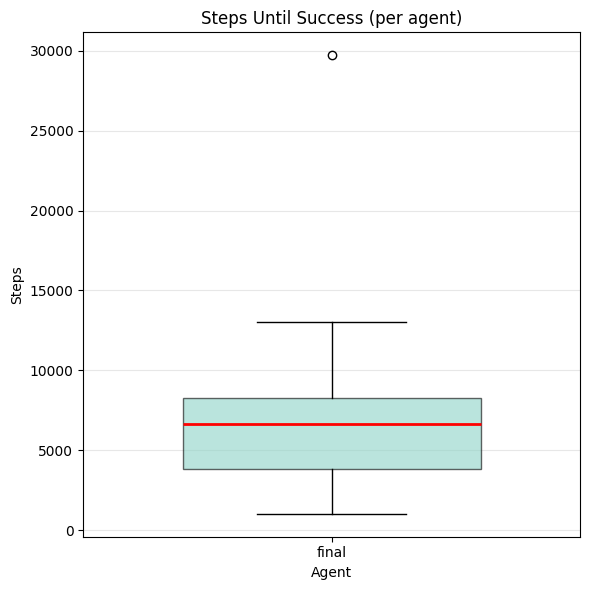

In [12]:
did_succeed = lambda reward, termination, truncation, info: info.get("explored_ratio", 0) >= 0.30

dq_final_results_5 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_5, max_steps=10000, did_succeed=did_succeed)
dq_final_results_10 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_10, max_steps=20000, did_succeed=did_succeed)
dq_final_results_20 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_20, max_steps=30000, did_succeed=did_succeed)
dq_final_results_30 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_30, max_steps=40000, did_succeed=did_succeed)

dq_final_results_5 = rename_inner_keys(dq_final_results_5, {dq_agent_id: "final"})
dq_final_results_10 = rename_inner_keys(dq_final_results_10, {dq_agent_id: "final"})
dq_final_results_20 = rename_inner_keys(dq_final_results_20, {dq_agent_id: "final"})
dq_final_results_30 = rename_inner_keys(dq_final_results_30, {dq_agent_id: "final"})

plot_all(dq_final_results_5, agents=["final"])
plot_all(dq_final_results_10, agents=["final"])
plot_all(dq_final_results_20, agents=["final"])
plot_all(dq_final_results_30, agents=["final"])

In una seconda fase, la valutazione viene ripetuta imponendo una soglia di successo pari al **40%**.

Evaluation: 100%|██████████| 20/20 [2:55:26<00:00, 526.35s/configuration run]  


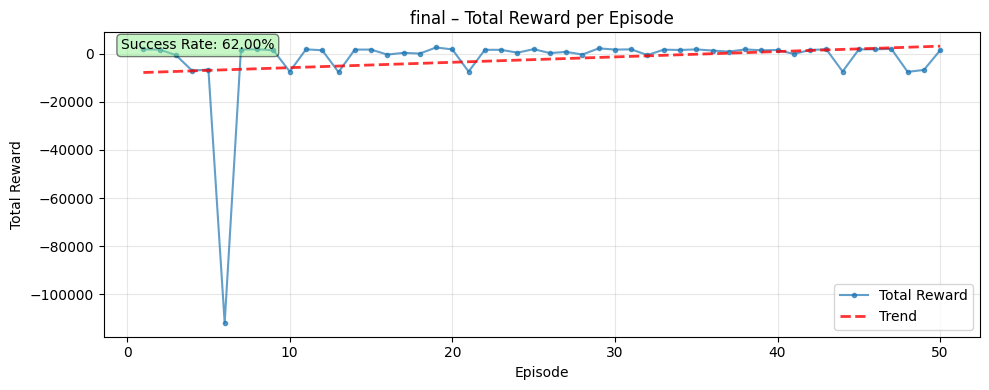

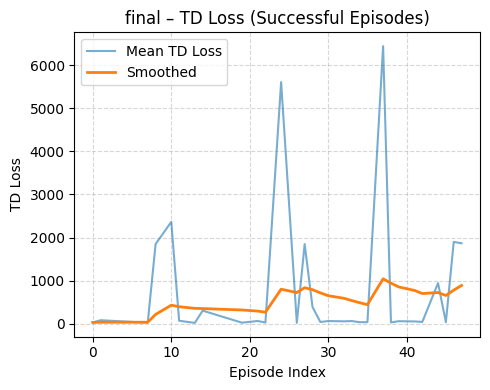

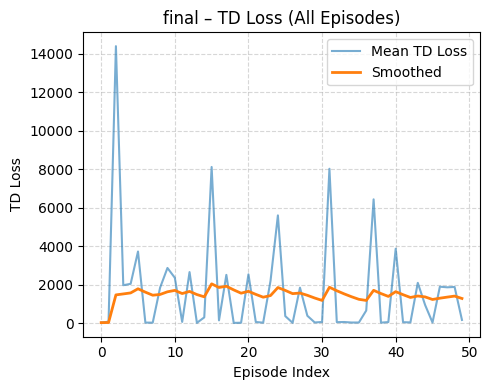

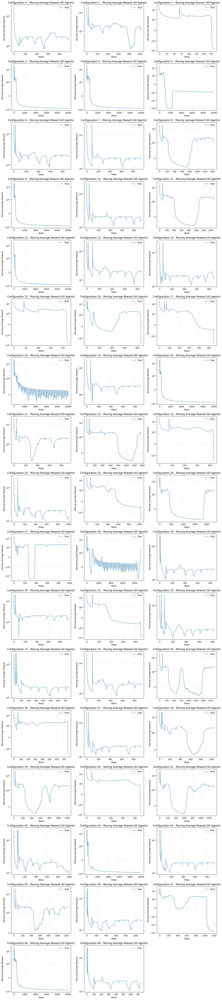

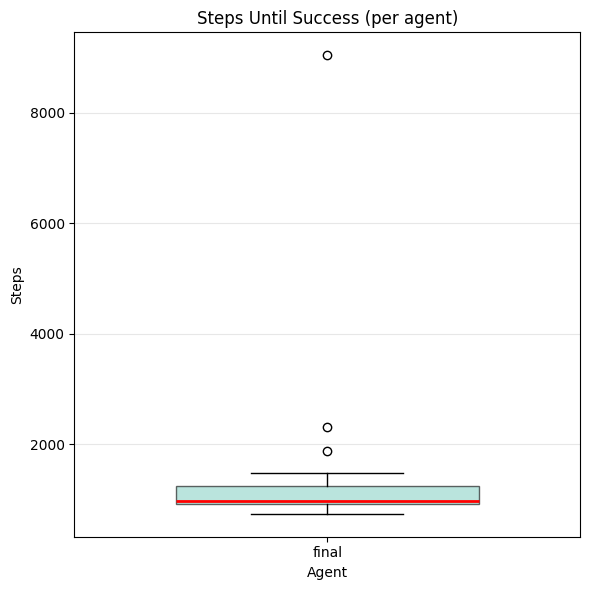

...

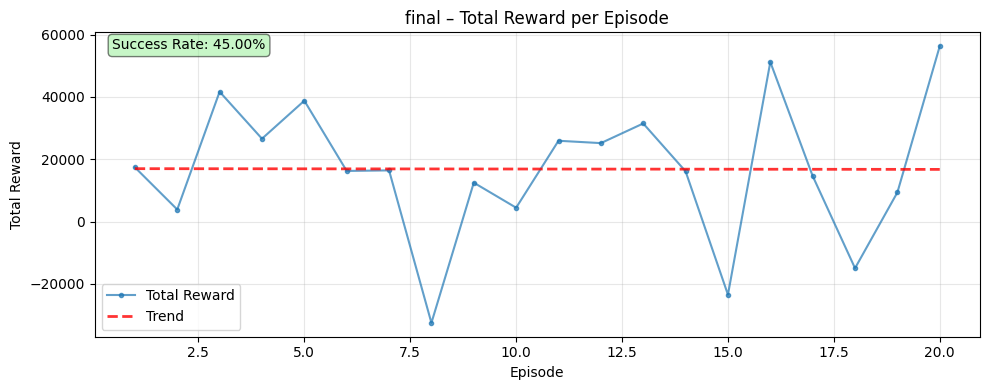

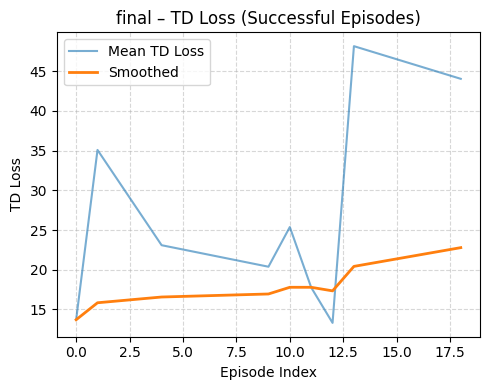

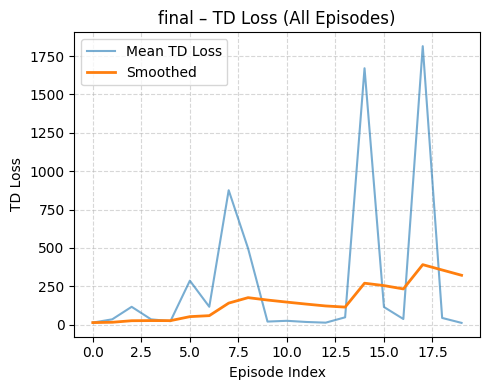

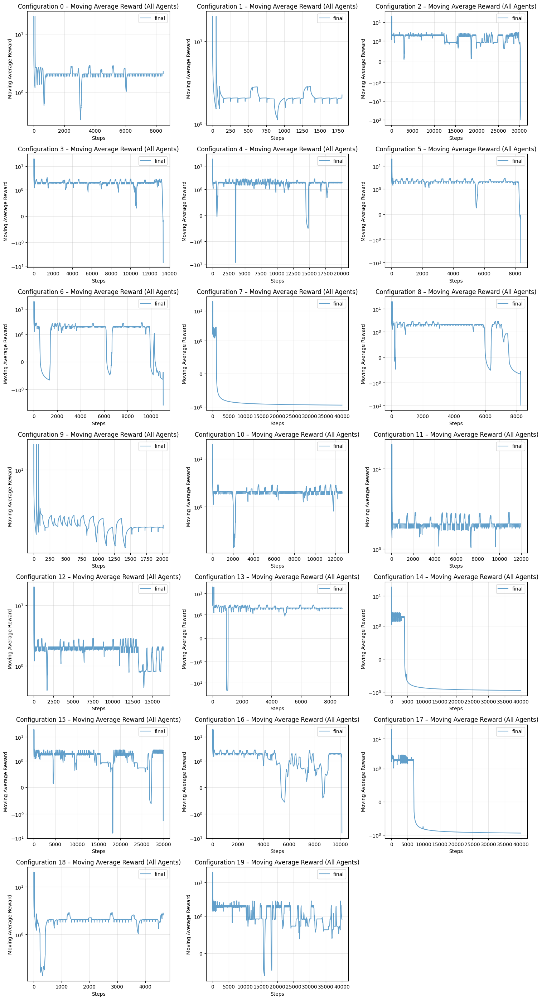

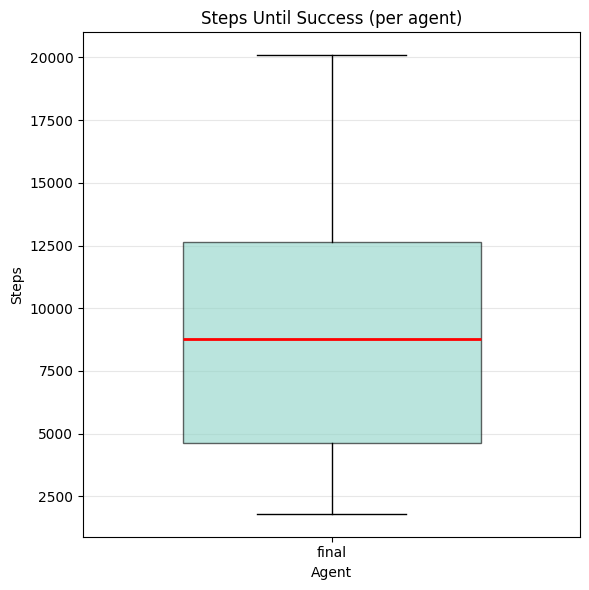

In [7]:
did_succeed = lambda reward, termination, truncation, info: info.get("explored_ratio", 0) >= 0.40

dq_final_results_5 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_5, max_steps=10000, did_succeed=did_succeed)
dq_final_results_10 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_10, max_steps=20000, did_succeed=did_succeed)
dq_final_results_20 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_20, max_steps=30000, did_succeed=did_succeed)
dq_final_results_30 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_30, max_steps=40000, did_succeed=did_succeed)

dq_final_results_5 = rename_inner_keys(dq_final_results_5, {dq_agent_id: "final"})
dq_final_results_10 = rename_inner_keys(dq_final_results_10, {dq_agent_id: "final"})
dq_final_results_20 = rename_inner_keys(dq_final_results_20, {dq_agent_id: "final"})
dq_final_results_30 = rename_inner_keys(dq_final_results_30, {dq_agent_id: "final"})

plot_all(dq_final_results_5, agents=["final"])
plot_all(dq_final_results_10, agents=["final"])
plot_all(dq_final_results_20, agents=["final"])
plot_all(dq_final_results_30, agents=["final"])

Successivamente, la soglia viene ulteriormente innalzata al **50%**, richiedendo una copertura più ampia dell’ambiente per classificare un episodio come riuscito.

Evaluation: 100%|██████████| 20/20 [6:54:05<00:00, 1242.28s/configuration run]  


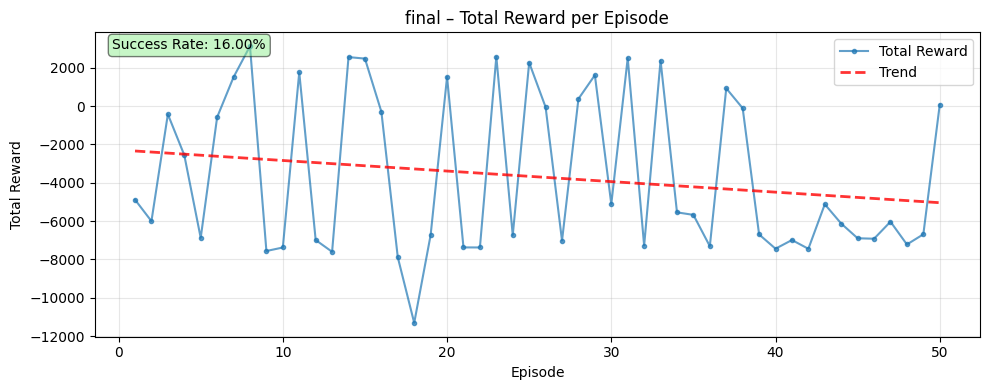

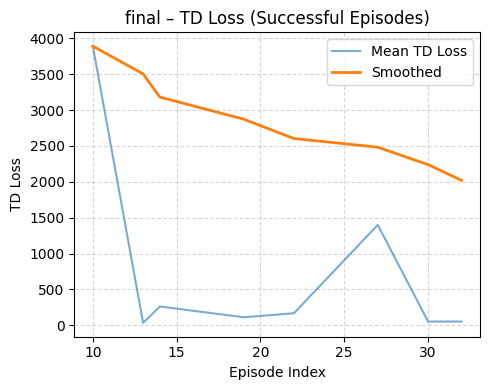

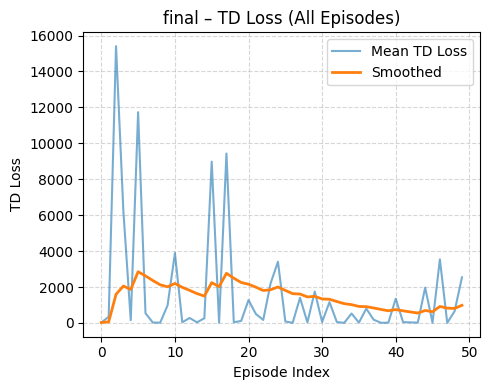

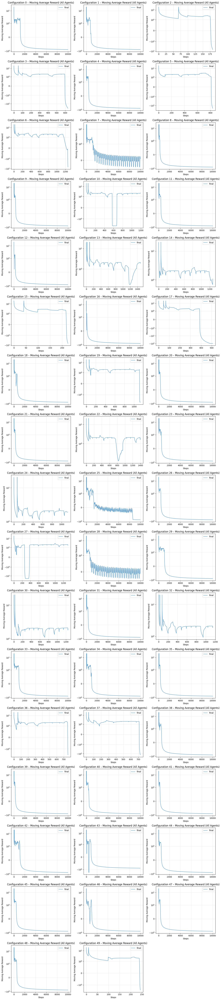

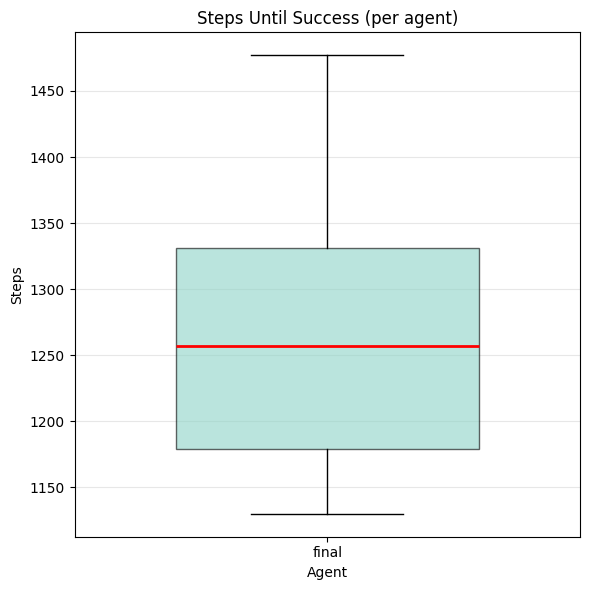

...

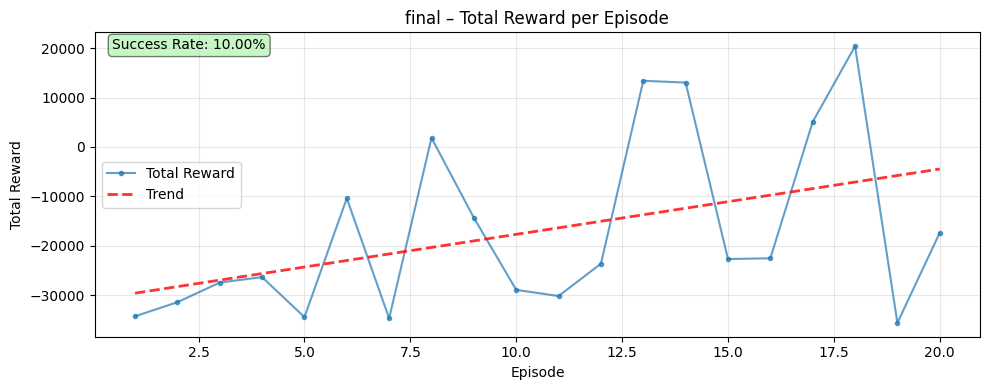

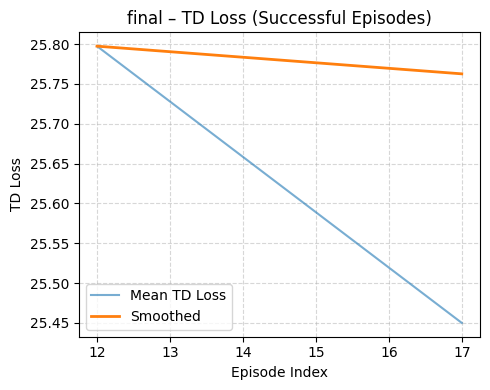

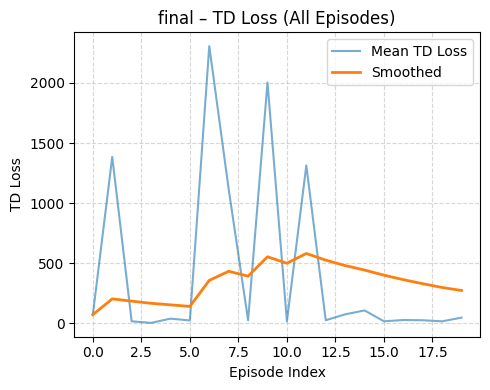

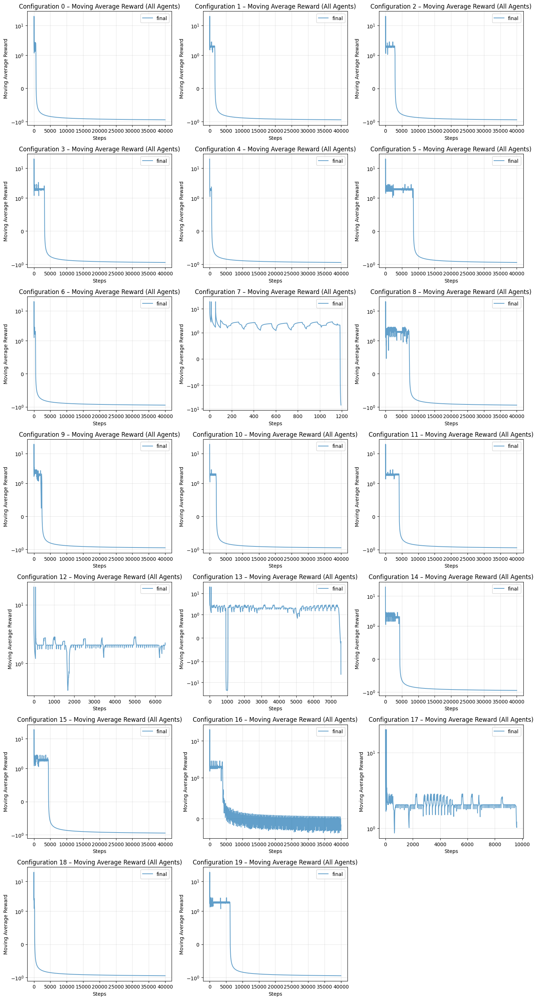

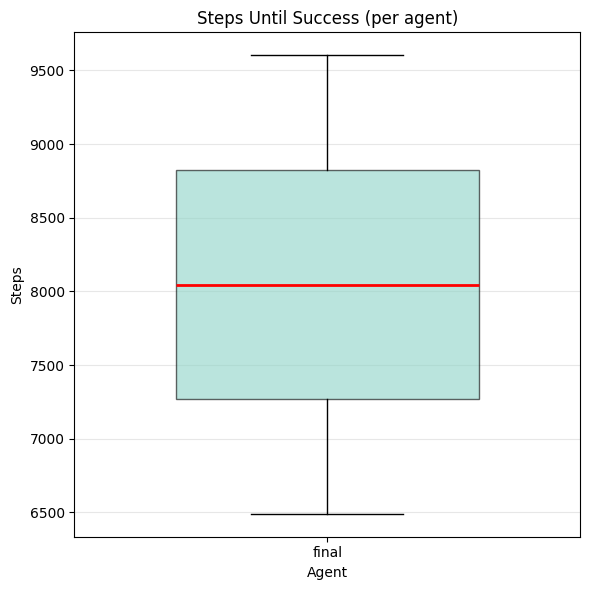

In [7]:
did_succeed = lambda reward, termination, truncation, info: info.get("explored_ratio", 0) >= 0.50

dq_final_results_5 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_5, max_steps=10000, did_succeed=did_succeed)
dq_final_results_10 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_10, max_steps=20000, did_succeed=did_succeed)
dq_final_results_20 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_20, max_steps=30000, did_succeed=did_succeed)
dq_final_results_30 = evaluate(env=dq_env, agents=dq_agents, configs=dq_configs_30, max_steps=40000, did_succeed=did_succeed)

dq_final_results_5 = rename_inner_keys(dq_final_results_5, {dq_agent_id: "final"})
dq_final_results_10 = rename_inner_keys(dq_final_results_10, {dq_agent_id: "final"})
dq_final_results_20 = rename_inner_keys(dq_final_results_20, {dq_agent_id: "final"})
dq_final_results_30 = rename_inner_keys(dq_final_results_30, {dq_agent_id: "final"})

plot_all(dq_final_results_5, agents=["final"])
plot_all(dq_final_results_10, agents=["final"])
plot_all(dq_final_results_20, agents=["final"])
plot_all(dq_final_results_30, agents=["final"])

I risultati mostrano che l’agente ottiene buone percentuali di successo per soglie di `explored_ratio` basse, in particolare negli ambienti di dimensioni ridotte e intermedie. All’aumentare della soglia richiesta, il tasso di successo diminuisce progressivamente in tutte le configurazioni, indicando che livelli di copertura più elevati risultano difficili da raggiungere.

Il numero medio di passi cresce con la dimensione della mappa e con la soglia di successo, riflettendo la maggiore complessità dell’esplorazione in ambienti più estesi.

##### Tabella risultati - soglia di successo 30%
| Mappa  | Tasso di Successo | Passi Medi |
|--------|-------------------|------------|
| 5×5    | 70%               | 750        |
| 10×10  | 70%               | 2100       |
| 20×20  | 40%               | 4700       |
| 30×30  | 85%               | 7000       |

##### Tabella risultati - soglia di successo 40%
| Mappa  | Tasso di Successo | Passi Medi |
|--------|-------------------|------------|
| 5×5    | 62%               | 1000       |
| 10×10  | 60%               | 2500       |
| 20×20  | 30%               | 4800       |
| 30×30  | 45%               | 7800       |

##### Tabella risultati - soglia di successo 50%
| Mappa  | Tasso di Successo | Passi Medi |
|--------|-------------------|------------|
| 5×5    | 16%               | 1250       |
| 10×10  | 25%               | 3200       |
| 20×20  | 5%                | 6500       |
| 30×30  | 10%               | 8000       |

Nota: i valori di `explored_ratio` risultano generalmente contenuti, in quanto la copertura viene stimata tramite una griglia virtuale che approssima l’esplorazione reale dell’ambiente.

### Analisi errori

Di seguito sono riportati i principali comportamenti errati osservati nell’agente Deep Q-Learning nel task di exploration.

#### Loop

L’esempio seguente mostra un ambiente 5×5. L’agente esplora inizialmente una porzione significativa dell’ambiente, seguendo prevalentemente il bordo della mappa e raggiungendo una copertura di circa il 60% delle celle esplorabili. Successivamente, il comportamento converge verso una traiettoria ciclica tra il bordo e un ostacolo, limitando l’accesso a nuove regioni dell’ambiente.

> Exploration: 60,87% of explorable cells covered. Coverage: 14 on 18 cells (total= 23).

![Deep Q-Agent Loop](../resources/exploration-deep-q-agent-loop.gif)

#### Collisione

Esempio di collisione in un ambiente 10×10. L’agente evita correttamente ostacoli e bordi per gran parte dell’episodio, ma la run termina con una collisione finale sul bordo, limitando la copertura complessiva a circa il 40%.

> Exploration: 41,24% of explorable cells covered. Coverage: 40 on 77 cells (total= 97).

![Deep Q-Agent Collide](../resources/exploration-deep-qagent-collide.gif)


I comportamenti osservati indicano che, sebbene l’agente apprenda strategie locali efficaci per evitare ostacoli, la combinazione di reward sparsa, osservazioni locali e stima approssimata della copertura limita la generalizzazione della politica in termini di esplorazione globale.

### Commenti finali

Il task di exploration si è rivelato particolarmente complesso e, nonostante l’ampio numero di esperimenti condotti, i risultati ottenuti non possono essere considerati soddisfacenti. Le difficoltà riscontrate suggeriscono che l’approccio adottato non è stato sufficiente a garantire una gestione efficace della complessità intrinseca del problema, indicando margini di miglioramento sia nella definizione della reward sia nella strategia di esplorazione.